# Olivier Bisson, Jérémy Gomes M2IM MSS
**Projet de fin d'étude:** 
### De la classification multilabel supervisée à l'apprentisage active en passant par du non supervisé pour l'identification taxonomique automatique des fragments de charbon de bois
***

# Sommaire Général

0. [Importation des pakages](#0.-Importation-des-pakages)
1. [Importation des données](#1.-Importation-des-données)
2. [Nettoyage, traitement et exploration des données](#2.-Nettoyage,-traitement-et-exploration-des-données)
3. [Visualisation des données et tentative de détéction de cluster](#3.-Visualisation-des-données-et-tentative-de-détection-de-cluster)
4. [Apprentissage automatique/statistique](#4.-Apprentissage-automatique/statistique)
5. [Apprentissage active par propagation d'étiquette/label](#5.-Apprentissage-active-par-propagation-d'étiquette/label)
***

## 0. Importation des pakages

In [2]:
# je dois supp tous les packages inutilisé

import csv
from pickle import TRUE
import pandas as pd
import numpy as np
import re
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA
from sklearn import ensemble

#from skimage import io
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm
import random
from time import time
import time
import random
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.cluster import SpectralCoclustering
from sklearn.metrics import silhouette_score
from PIL import Image
from scipy.stats import chi2_contingency
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn import metrics
from sklearn import tree
from time import time
%matplotlib inline


pd.options.mode.chained_assignment = None  # default='warn' remove warnings of copy

## 1. Importation et courte présentation des données

## Sommaire de la première partie
1. [Importation des données](#1.-Importation-des-données) 
2. [Courte présentation des données](#2.-Courte-présentation-des-données) 

##### 1. Importation des données

* Définissons une fonction "import_data" qui permet d'importer n'importe qu'elle fichier csv et de le stocker dans une data frame. 
* Cette fonction prendra comme argument:
     - le chemin d'accés du fichier csv dans la variable PATH
     - Et le nombre de ligne en en-tete que nous souhaitons ignorer dans la variable header 
* Et elle retournera une data frame ainsi q'une chaine de caractère indiquant la dimension du data frame
     

In [3]:
def import_data(PATH, header):
    data = pd.read_csv(PATH, delimiter=";", encoding = "ISO-8859-1", header=header)
    print("importation d'une data frame de taille " + str(data.shape))
    return data
    
#PATH = "/SACharcoalCollectionFeatures_EP_24_.06.22.csv"
#PATH = "SACharcoalCollectionFeatures_EP_24_.06.22.csv" #  <=====  Remplire
PATH = "C:/Users/User/Documents/SACharcoalCollectionFeatures_EP_24_.06.22.csv" #  <=====  Remplire
header = 5  # <=====  Remplire
data = import_data(PATH, header)



##########
### OK ###
##########

importation d'une data frame de taille (605, 202)


## 2. Nettoyage, traitement et exploration des données

## Sommaire de la deuxième partie
1. [Nettoyage sur l'ensemble de nos données](#1.-Nettoyage-sur-l'ensemble-de-nos-données) 
2. [Séparation des features et des labels](#2.-Séparation-des-features-et-des-labels)
3. [Traitement des noms des colonnes des features](#3.-Traitement-des-noms-des-colonnes-des-features)
4. [Nettoyage de nos données d'entrées](#4.-Nettoyage-de-nos-données-d'entrées)
5. [Statistique sur nos données d'entrées](#5.-Statistique-sur-nos-données-d'entrées)
6. [Encodage en 0-1 de nos données d'entrées](#6.-Encodage-en-0-1-de-nos-données-d'entrées)
7. [Clean label](#7.-Clean-label)
8. [Stats labels ](#8.-Stats-labels)

##### 1. Nettoyage sur l'ensemble de nos données



* implémentons une fonction "clean_data" qui va prendre en entrée: 
     - une data frame dite "sale", dans le sense pas nettoyé 
     - une colonne de référence de cette data frame (une colonnes qui ne possède pas de valeur manquante), colonne identifiant
     - features_mean, 
     - et l 
* Cette fonction retournera une data frame dite "nettoyé": 
     - sans colonnes comportant uniquement des valeurs manquantes, 
     - sans colonnes unnamed 
     - sans colones des moyennes
     - sans les colones en surplus spécifié par l'équipe des chercheurs
     - sans lignes vides
     - et...

In [4]:
def clean_data(data, col_ref, collection, features_mean, l):
    shape_data_before = data.shape
    print("dimension data frame initial est:" + str(shape_data_before))
    if (type(collection) == str): #on verifie si collection contient que un seul non de colonne
        data = data[data[col_ref] == collection]
    if (type(collection) == tuple):
        data = data[(data[col_ref] == collection[0]) | (data[col_ref] == collection[1]) | (data[col_ref] == collection[2])]
    print('séléction des lignes de colléction ' + str(collection))
    res = list(data.columns)[np.where(data.columns == l)[0][0]:]
    data.drop(res, axis=1, inplace=True)
    #print("Le nombre de colonnes avec uniquement des valeurs manquantes est :", count_missing_columns(data))
    print('Envlever toutes les colonnes à partir de la 162 inclue') #Pq ?????? analyser le fichier excel
    data.drop(features_mean, axis=1, inplace=True)
    print('suppresion des colonnes mean')
    data.dropna(how='all', axis=1, inplace=True)
    print('suppresion des collonnes vides')
    data_reduce = data.loc[:,~data.columns.str.match("Unnamed")]
    print('suppression des colonnes unnamed')
    shape_data_after = data_reduce.shape
    print(str(shape_data_before[0]-shape_data_after[0]) + ' lignes vides supprimées')
    print(str(shape_data_before[1]-shape_data_after[1]) + ' colonnes vides ou unnamed supprimées')
    print(shape_data_after)
    return data_reduce

features_mean = ['44 - Mean tangential diameter (¾m)', '51 - Mean vessel density (V/mm? )', '55 - Mean vessel element length (¾m)', '116b - Mean ray / mm']
collection = ('IAWA', 'Wits ESI', 'Wits ESI / CEPAM')
#collection = 'IAWA'
col_ref = 'Collection' #  <=====  Remplire
l = '162M - Silica bodies in fibres'

data_frame = clean_data(data, col_ref, collection, features_mean, l)

dimension data frame initial est:(605, 202)
séléction des lignes de colléction ('IAWA', 'Wits ESI', 'Wits ESI / CEPAM')
Envlever toutes les colonnes à partir de la 162 inclue
suppresion des colonnes mean
suppresion des collonnes vides
suppression des colonnes unnamed
72 lignes vides supprimées
46 colonnes vides ou unnamed supprimées
(533, 156)


##### 2. Séparation des features et des labels

* Nous allons implémenter deux fonction:
     - Une qui va nous permettre de récuperer les features à partir de nos données et de les stocker dans une autres dataframe que nous allons traiter par la suite; 
     - Et une autre qui va nous permettre de récuper les labels potentiel à partir de nos données et de les stocker dans une autres data frame que nous allons traiter par la suite; 

In [5]:
def get_labels(data_frame, labels):
    data_frame_family = data_frame[labels]
    print('formation des labels de dimmension ' + str(data_frame_family.shape) + ' à vous de les traiter')
    return data_frame_family
    

def get_features(data_frame, list_no_features):
    data_frame.drop(columns=data_frame[list_no_features],inplace=True)
    print('formation des features, de dimension ' + str(data_frame.shape) + ' à vous de les traiter')
    return data_frame

    

labels_1 = 'Family'    #  <=====  Remplire
labels_2 = 'Scientific name'
labels_3 = 'Collection'
list_no_features = ['Collection', 'BPI/20', 'CODE collector', 'Collector', 'Locality', 'Family', 'Scientific name', 'Synonyme', 'Common name']       #  <=====  Remplire
#list_no_features = ['Collection', 'Family', 'Scientific name', 'Synonyme'] #liste à modifier selon la colléction choisie

data_frame_family = get_labels(data_frame, labels_1)
data_frame_genus = get_labels(data_frame, labels_2)
data_frame_collection = get_labels(data_frame, labels_3)
data_frame = get_features(data_frame, list_no_features)
print(data_frame_collection)

formation des labels de dimmension (533,) à vous de les traiter
formation des labels de dimmension (533,) à vous de les traiter
formation des labels de dimmension (533,) à vous de les traiter
formation des features, de dimension (533, 147) à vous de les traiter
0                  IAWA
1                  IAWA
2                  IAWA
3                  IAWA
4                  IAWA
             ...       
528    Wits ESI / CEPAM
529    Wits ESI / CEPAM
530    Wits ESI / CEPAM
531    Wits ESI / CEPAM
532    Wits ESI / CEPAM
Name: Collection, Length: 533, dtype: object


##### 3. Traitement des noms des colonnes des features

* Implémentons une fonoction qui va renomer les noms des collones de nos features par leurs numéros de références associé et qui va redisposer les features dans l'ordre croissant numériquement en fonction de leurs nouveaux noms de collones

In [6]:
data_frame.columns

Index(['1 - Growth ring boundaries distinct',
       '2 - Growth ring boundaries indistinct or absent',
       '3 - Wood ring-porous', '4 - Wood semi-ring-porous',
       '5 - Wood diffuse-porous',
       '45M - Vessels of two distinct diameter classes, wood not ring-porous',
       '40 - <= 50 ¦¾m', '41 - 50 - 100 ¦¾m', '42 - 100 - 200 ¦¾m',
       '43 - >= 200 ¦¾m',
       ...
       '152M - Crystals of other shapes (mostly small)', '153M - Crystal sand',
       '154M - More than one crystal of about the same size per cell or chamber',
       '155M - Two distinct sizes of crystals per cell or chamber',
       '156 - Crystals in enlarged cells', '157M - Crystals in tyloses',
       '158M - Cystoliths', '159M - Silica bodies present',
       '160M - Silica bodies in ray cells',
       '161M - Silica bodies in axial parenchyma cells'],
      dtype='object', length=147)

In [7]:
# il y a un truc bizzare ici, il met des 1 dans le data frame 
# exple dans la collones 5 tous les 5 sont remplacé par des 1 A VERIFIER 

def clean_column_names(data_frame):
    for i in data_frame.columns:
        val = ""
        val=re.split('(\d+)',i)
        data_frame.rename(columns={i:val[1]}, inplace=True)
    print("noms des colonnes remplacé par leurs valeurs associé avec succés")
    data_frame.columns = pd.to_numeric(data_frame.columns, downcast='integer')
    print("conversion des noms de collones par leur numeros de référence associé réalisé avec succé")
    data_frame = data_frame.sort_index(axis=1)
    data_frame = data_frame.astype(int, errors='ignore')
    to_replace = '[0-9]$'
    data_frame = data_frame.replace(to_replace= to_replace, value= 1, regex=True)
    print("les colonnes on était triées dans l'odre croissant de leurs noms de colonne")
    return data_frame

data_frame = clean_column_names(data_frame)

noms des colonnes remplacé par leurs valeurs associé avec succés
conversion des noms de collones par leur numeros de référence associé réalisé avec succé
les colonnes on était triées dans l'odre croissant de leurs noms de colonne


In [8]:
data_frame.columns

Index([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,
       ...
       152, 153, 154, 155, 156, 157, 158, 159, 160, 161],
      dtype='int16', length=147)

##### 4. Nettoyage de nos données d'entrées 


* Rappelons que nous avons supposé que les valeurs manquantes correspondent au fait que les chercheurs n'ont pas observé les caractérisiques sur l'échantillon. Ainsi nous allons modéliser le fait que le chercvheur n'a pas observé cette caractéristique sur l'echantillon par un 0
* Implémentons une fonctions qui va remplacer les Nan par des 0 et qui va remplacer toutes les valeurs certaines par des 1

In [9]:
pd.options.display.max_columns = 180
data_frame # je comprends pas pourquoi il y a des 1 partout      BIZARD

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,45,46,47,48,49,50,52,53,54,56,57,58,60,61,62,63,64,65,66,67,68,69,70,71,72,73,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,130,132,133,134,136,137,138,139,140,141,142,143,144,145,146,148,149,150,151,152,153,154,155,156,157,158,159,160,161
0,NaN,1,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,23v,NaN,1,26v,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,36v,37v,NaN,NaN,40v,1,NaN,NaN,NaN,NaN,47v,1,49v,NaN,52v,1,NaN,NaN,NaN,1,NaN,1,NaN,NaN,NaN,1,66v,NaN,NaN,1,NaN,1,NaN,NaN,1,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,115v,116v,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,2v,NaN,NaN,1,NaN,NaN,NaN,9v,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,23?,24v,1,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40v,1,NaN,NaN,45v,NaN,NaN,NaN,1,1,NaN,1,NaN,NaN,NaN,1,NaN,NaN,1,1,NaN,NaN,1,NaN,NaN,NaN,1,71?,72?,73?,75v,76v,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,1,1,NaN,NaN,NaN,NaN,112?,113?,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,23v,NaN,1,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,1,1,NaN,NaN,NaN,52?,53?,NaN,NaN,NaN,1,NaN,1,NaN,NaN,NaN,1,66v,NaN,NaN,1,NaN,71?,72?,73?,1,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,92v,1,NaN,1,97v,NaN,NaN,100v,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,1,NaN,NaN,1,1,NaN,NaN,NaN,NaN,NaN,12?,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,23?,1,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN,NaN,NaN,NaN,NaN,NaN,49?,50?,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN,1,1,1,NaN,NaN,1,NaN,1,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,1,NaN,12?,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,23?,NaN,25?,26?,27?,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN,NaN,45?,NaN,NaN,NaN,49?,50?,52?,53?,54?,NaN,NaN,1,NaN,1,NaN,63?,NaN,NaN,1,NaN,NaN,1,NaN,71?,72?,73?,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,112?,113?,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
528,NaN,1,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,1,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,1,1,NaN,1,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,1,49v,NaN,1,53v,NaN,NaN,N

In [10]:
def get_data_01iv(data_frame):
    data_frame = data_frame.fillna(0) # on remplace les nan par 0
    print("remplacement des valeurs manquantes les Nan par des 0")
    #data_frame.shape
    nb_row_df = data_frame.shape[0]
    nb_col_df = data_frame.shape[1]
    for i in np.arange(0 , nb_row_df , 1):    
        for j in np.arange(0 , nb_col_df , 1):
            res = str(data_frame.iloc[i,j])
            if ( res[-1].isnumeric()):
                if (float(res)>0):
                    data_frame.iloc[i,j] = 1
    for i in data_frame.columns:
        try:
            data_frame[[i]] = data_frame[[i]].astype(float).astype(int) #df[[i]] is the columns of value i
        except:
            pass
    print("replacement des valeurs certaine par 1")
    return data_frame

data_frame = get_data_01iv(data_frame)
#data_frame
#np.random.binomial(size=1, n=1, p= 0.5)[0]

remplacement des valeurs manquantes les Nan par des 0
replacement des valeurs certaine par 1


In [11]:
pd.options.display.max_columns = 180
data_frame

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,45,46,47,48,49,50,52,53,54,56,57,58,60,61,62,63,64,65,66,67,68,69,70,71,72,73,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,130,132,133,134,136,137,138,139,140,141,142,143,144,145,146,148,149,150,151,152,153,154,155,156,157,158,159,160,161
0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,23v,0,1,26v,0,0,1,0,0,0,0,0,36v,37v,0,0,40v,1,0,0,0,0,47v,1,49v,0,52v,1,0,0,0,1,0,1,0,0,0,1,66v,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,115v,116v,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,2v,0,0,1,0,0,0,9v,0,0,0,1,0,0,0,0,0,0,0,0,1,23?,24v,1,0,0,0,1,0,0,0,0,0,0,0,0,0,40v,1,0,0,45v,0,0,0,1,1,0,1,0,0,0,1,0,0,1,1,0,0,1,0,0,0,1,71?,72?,73?,75v,76v,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,112?,113?,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,23v,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,52?,53?,0,0,0,1,0,1,0,0,0,1,66v,0,0,1,0,71?,72?,73?,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,92v,1,0,1,97v,0,0,100v,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,1,1,0,0,0,0,0,12?,1,0,0,0,0,0,0,0,0,1,23?,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,49?,50?,0,1,0,0,0,0,0,0,1,1,0,1,1,1,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,1,0,0,0,0,1,0,12?,1,0,0,0,0,0,0,0,0,1,23?,0,25?,26?,27?,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,45?,0,0,0,49?,50?,52?,53?,54?,0,0,1,0,1,0,63?,0,0,1,0,0,1,0,71?,72?,73?,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,112?,113?,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
528,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,49v,0,1,53v,0,0,0,0,0,1,0,63v,0,0,1,0,1,0,0,0,0,0,0,76v,0,1,1,1,0,82v,1,0,0,0,0,0,89?,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,134v,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
529,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,26v,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,57?,0,0,1,0,0,0,0,1,0,68v,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,92v,0,0,0,1,98v,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
530,1?,1,0,0,1,0,0,0,0,0,0,12v,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,49v,0,1,53v,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,116v,0,0,0,0,0,0,0,0,0,130?,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,156v,0,0,0,0,0
531,1v,1,0,0,1,0,0,0,0,0,0,12v,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,53v,0,0,0,0,0,1,0,0,0,0,1,0,0,69v,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,86v,0,0,0,0,0,1,1,0,1,0,0,0,100v,0,102v,0,0,1,0,107v,108v,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


##### 5. Statistique sur nos données d'entrées

* Implémentons une fonction qui renvoit les stats des données certaines, incertaines, variables et manquantes sur l'ensemble des caractéristiques

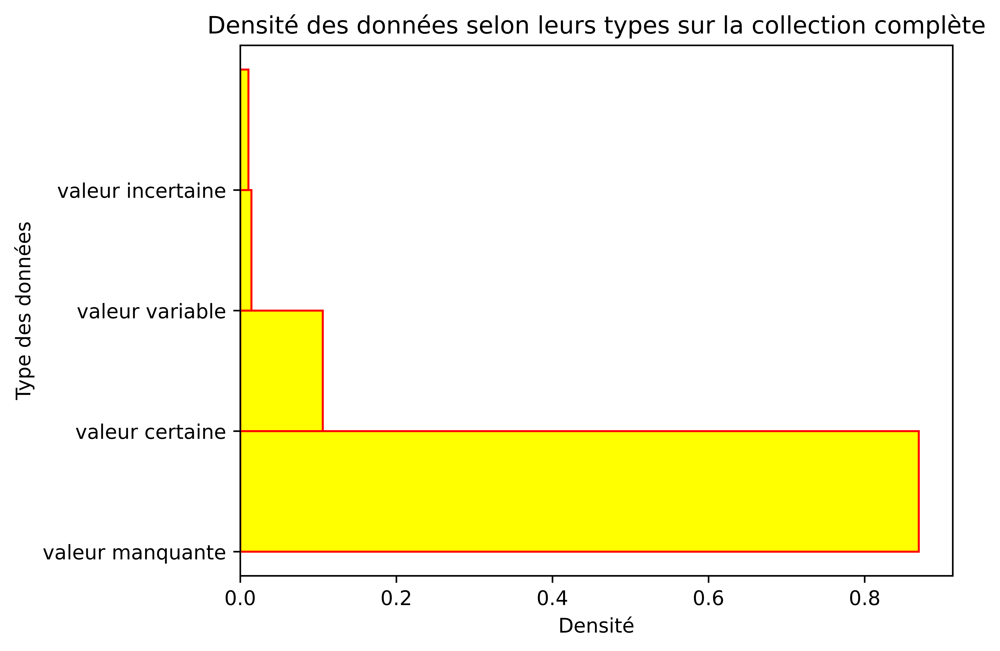

In [12]:
def hist_obs_type(data_frame):
    occur = [] 
    for j in range(len(data_frame.columns)) :
        for i in range(len(data_frame.index)) :
            if data_frame.iloc[i,j] == 0:
                occur.append('valeur manquante')
            elif data_frame.iloc[i,j] == 1:
                occur.append('valeur certaine')
            elif re.split('[0-9]+',data_frame.iloc[i,j])[1] == '?':
                occur.append('valeur incertaine')
                #data_frame.iloc[i,j] = np.nan #replace '?' by nan, CHOICE OF MODEL FOR KNNINPUTERS
            elif re.split('[0-9]+',data_frame.iloc[i,j])[1] == 'v':
                occur.append('valeur variable')
                #data_frame.iloc[i,j] = np.random.binomial(size=1, n=1, p= 0.5)[0] #replace 'v' by binomial (0,1) CHOICE OF MODEL
    plt.figure(dpi=dpi)
    plt.hist(occur, range = (0, 4), bins = 4, color = 'yellow', edgecolor = 'red', orientation='horizontal', density=True)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.yticks(fontsize=fontsize)
    plt.title(title)
    plt.savefig(fname)
    plt.show()

fname = "C:/Users/User/Desktop/imagepfe/oralepfeimg1"
dpi = 1200 # gère le zoom de l'hist
fontsize = 10 # gère la taille des caractères des noms des labels
title = 'Densité des données selon leurs types sur la collection complète'
ylabel = 'Type des données'
xlabel = 'Densité'

hist_obs_type(data_frame)

* implémenton une fonction quei renvoie le nombre des données selon leur type, qui remplace les valeur incertaine par des Nan pour les prépare au knn inputer et qui remplace les valeur variable par des 0 ou des 1 selon une binomiale

In [13]:
# renommer la fonction

def count_replace(data_frame):
    occur = []
    for j in range(len(data_frame.columns)) :
        nb_0 = 0
        nb_1 = 0
        nb_i = 0
        nb_v = 0
        for i in range(len(data_frame.index)) :
            if data_frame.iloc[i,j] == 0:
                nb_0 += 1
            elif data_frame.iloc[i,j] == 1:
                nb_1 += 1
            elif re.split('[0-9]+',data_frame.iloc[i,j])[1] == '?':
                nb_i += 1
                data_frame.iloc[i,j] = np.nan #replace '?' by nan, CHOICE OF MODEL FOR KNNINPUTERS
            elif re.split('[0-9]+',data_frame.iloc[i,j])[1] == 'v':
                nb_v += 1
                data_frame.iloc[i,j] = np.random.binomial(size=1, n=1, p= 0.5)[0] #replace 'v' by binomial (0,1) CHOICE OF MODEL
        occur.append([nb_0, nb_1, nb_i, nb_v])
    (shape_1, shape_2) = np.shape(occur)
    stacked_occur = np.reshape(occur, newshape=(shape_1,shape_2))
    number_0 = sum([i[0] for i in stacked_occur])
    number_1 = sum([i[1] for i in stacked_occur])
    number_i = sum([i[2] for i in stacked_occur])
    number_v = sum([i[3] for i in stacked_occur])
    total_number = number_0+number_1+number_i+number_v
    percentage_0 = number_0/(total_number)
    percentage_1 = number_1/(total_number)
    percentage_i = number_i/(total_number)
    percentage_v = number_v/(total_number)
    print(percentage_0+percentage_1+percentage_i+percentage_v)
    print('Percentage of (0,1,?,v): ', (percentage_0*100,percentage_1*100,percentage_i*100,percentage_v*100))   
    
stats = count_replace(data_frame)
stats

#peut etre essayer d'afficher l'hist avec 

1.0
Percentage of (0,1,?,v):  (86.93698867914897, 10.575487230539496, 1.0529540146264884, 1.4345700756850583)


* interprétation du résultat: 
               - grande quantité de valeur manquante 
               - quantité de valeur incertaine et variable non négligeable par rapport à la quantité certaine

##### 6. Encodage en 0-1 de nos données d'entrées 

* Nous allons implémenter une fonction  "get_data_01" qui va remplacer les valeurs incertaines par des 0 ou des 1 grace à la méthodes des KNNImputer décrit dans le rapport

* et qui va remplacer les valeurs variables par des 0 ou des 1 grace à une loi binomiale

In [14]:
def get_data_01(data_frame):
    imputer = KNNImputer(missing_values=np.nan, n_neighbors=2, weights="uniform")
    data_frame = pd.DataFrame(imputer.fit_transform(data_frame), columns=data_frame.columns)
    data_frame = data_frame.astype(int, errors='ignore')
    return data_frame

data_frame = get_data_01(data_frame)
data_frame

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,45,46,47,48,49,50,52,53,54,56,57,58,60,61,62,63,64,65,66,67,68,69,70,71,72,73,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,130,132,133,134,136,137,138,139,140,141,142,143,144,145,146,148,149,150,151,152,153,154,155,156,157,158,159,160,161
0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,1,1,1,0,1,1,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,1,0,0,0,1,0,0,1,1,0,0,1,0,0,0,1,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,1,1,1,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
528,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
529,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
530,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
531,1,1,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,0,0,0,1,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


* Vérifion que notre data ne présente plus de valeurs incertaines et variables

In [15]:
stats = count_replace(data_frame)
stats

1.0
Percentage of (0,1,?,v):  (88.49663692869268, 11.503363071307323, 0.0, 0.0)


##### 7. Clean label

* Implémentons une fonction "clean_labels" qui nettoyer les données de sortie, de facons à avoir des classes unique pour chaque échantillon




Lors de la phase de la phase de remplissage de la colléction pour chaque observation de spécimen de fragement de charbon de bois sa famille ainsi que son genre lui était imputé. Enn ce qui concerne l'inputation de la famille cela consiste au remplissage de la colonne 'Family' de la collection par un mot correspondand à la famille de l'échantillon.
IL s'agit alors d'introduire une syntaxe unique afin de s'assurer de l'unicité de classe pour chaque famille. Ainsi nous allons réécrire chaque mots en majuscule. Nous observons égalemnt que certaine observation sont assigné à plusieurs famille. En effet pour certain spéciment les chercheurs hésitais quant à la famiile à laquelle ces observations appartenaient. 
* Nous allons quantifier le nombre d'oservation dont la famille est incertaine
* Après les avoirs bien quantifier nous allons les traiter de facon à les assigner une unique fammille 

In [16]:
data_frame_family

0             SAPINDACEAE 
1         PICRODENDRACEAE 
2             SAPINDACEAE 
3            CELASTRACEAE 
4                RUTACEAE 
              ...         
528           COMBRETACEAE
529    FABACEAE MIMOSACEAE
530          ANACARDIACEAE
531              EBENACEAE
532              MYRTACEAE
Name: Family, Length: 533, dtype: object

In [17]:
data_frame_genus

0                        Allophylus cobbe (L.) Raeuschel
1      Androstachys johnsonii Prain (LEBOMBO IRONWOOD...
2                                Blighia unijugata Baker
3                                   Hartogiella capensis
4                      Ptaeroxylon obliquum (SNEEZEWOOD)
                             ...                        
528                                   Combretum cf molle
529                                    Senegalia burkei 
530                     Sclerocarya birrea subsp caffra 
531                                    Euclea natalensis
532                                   Syzygium guineense
Name: Scientific name, Length: 533, dtype: object

In [18]:
data_frame_collection

0                  IAWA
1                  IAWA
2                  IAWA
3                  IAWA
4                  IAWA
             ...       
528    Wits ESI / CEPAM
529    Wits ESI / CEPAM
530    Wits ESI / CEPAM
531    Wits ESI / CEPAM
532    Wits ESI / CEPAM
Name: Collection, Length: 533, dtype: object

In [19]:
def stats_labels(labels):
    acc = []
    labels = list(labels)
    for i in range(len(labels)):
        res = labels[i]
        if (len(res.split()) == 1):
            acc.append('certain')
        if (len(res.split()) > 1):
            if (list(res.split()[1])[0] == '('):
                acc.append('certain')
            if (list(res.split()[1])[0] != '('):
                acc.append('incertain')
    return acc

def count_occurrences(liste):
    count = {}
    for item in liste:
        if item in count:
            count[item] += 1
        else:
            count[item] = 1
    return count

labels = data_frame_family

x = stats_labels(labels)
y = count_occurrences(x)
print(x)
print(y)

['certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'certain', 'incertain', 'incertain', 'incertain', 'incertain', 'incertain', 'incertain', 'incertain', 'incertain', 'incertain', 'incertain', 'incertain', 'incertain', 'certain', 'certain', 'incert

* implémentons une fonction qui renvoie la densité des observations selon la certitude que nous avons sur leurs assignations quant à leurs familles

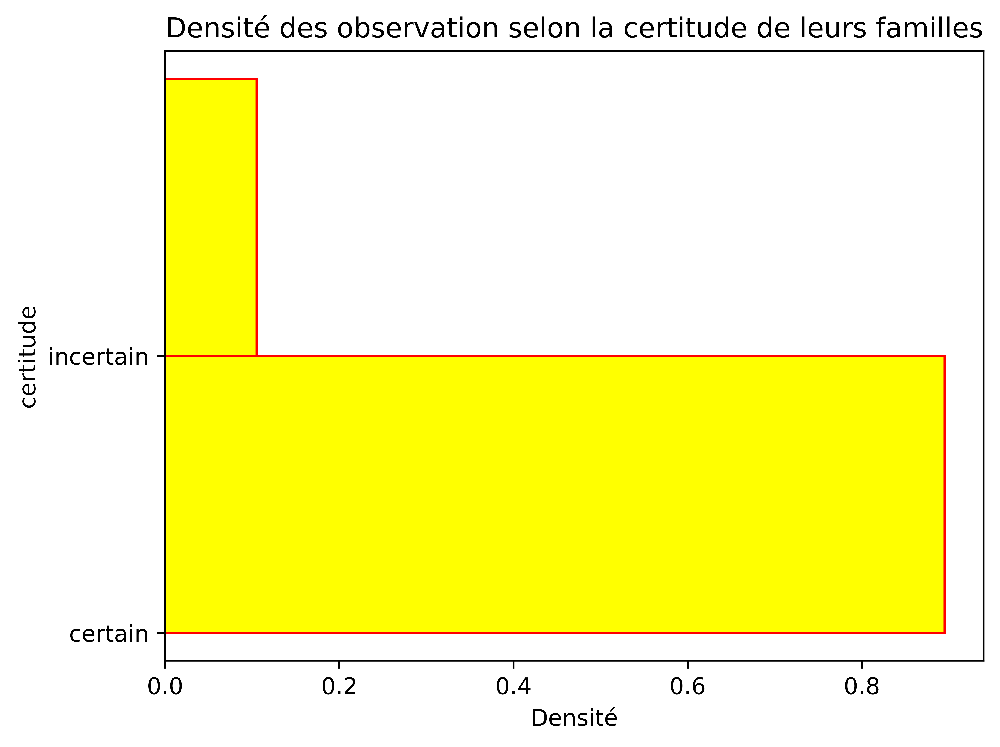

In [20]:
def hist_obs_certitude(labels):
    acc = []
    labels = list(labels)
    for i in range(len(labels)):
        res = labels[i]
        if (len(res.split()) == 1):
            acc.append('certain')
        if (len(res.split()) > 1):
            if (list(res.split()[1])[0] == '('):
                acc.append('certain')
            if (list(res.split()[1])[0] != '('):
                acc.append('incertain')
    plt.figure(dpi=dpi)
    plt.hist(acc, range = (0, 2), bins = 2, color = 'yellow', edgecolor = 'red', orientation='horizontal', density=True)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.yticks(fontsize=fontsize)
    plt.title(title)
    plt.savefig(fname)
    plt.show()
    

fname =  "C:/Users/User/Desktop/imagepfe/oralepfeimg3"   
dpi = 1200 # gère le zoom de l'hist
fontsize = 10 # gère la taille des caractères des noms des labels
title = 'Densité des observation selon la certitude de leurs familles'
ylabel = 'certitude'
xlabel = 'Densité'

hist_obs_certitude(labels)

In [21]:
def clean_labels(data_frame_family):
    data_frame_family = data_frame_family.str.upper() # on met tout les éléments en maj
    print("Les noms de labels on était réécrit en majuscules")
    data_frame_family = data_frame_family.str.split().str[0] #split on garde que
    data_frame_family = data_frame_family.str.split('(').str[0] # on supprime les espaces à la fin
    print("les noms des labels sont composé uniquement du premier mots sans espace à la fin ")
    return data_frame_family

data_frame_family = clean_labels(data_frame_family)
print(data_frame_family)
print("__________________________________________________________________________")
data_frame_genus = clean_labels(data_frame_genus) 
print(data_frame_genus)


Les noms de labels on était réécrit en majuscules
les noms des labels sont composé uniquement du premier mots sans espace à la fin 
0          SAPINDACEAE
1      PICRODENDRACEAE
2          SAPINDACEAE
3         CELASTRACEAE
4             RUTACEAE
            ...       
528       COMBRETACEAE
529           FABACEAE
530      ANACARDIACEAE
531          EBENACEAE
532          MYRTACEAE
Name: Family, Length: 533, dtype: object
__________________________________________________________________________
Les noms de labels on était réécrit en majuscules
les noms des labels sont composé uniquement du premier mots sans espace à la fin 
0        ALLOPHYLUS
1      ANDROSTACHYS
2           BLIGHIA
3       HARTOGIELLA
4       PTAEROXYLON
           ...     
528       COMBRETUM
529       SENEGALIA
530     SCLEROCARYA
531          EUCLEA
532        SYZYGIUM
Name: Scientific name, Length: 533, dtype: object


##### 8. Stats labels 


* une fois les labels bien traiter nous allons pouvoir représenter graphiquement à l'aide d'un histogramme la répartiton des observation par famille afin d'avoir une idée sur l'equilibre de nos données
* Nous allons implémenter une fonction qui renvoie la répartition des observation selon leurs famiiles

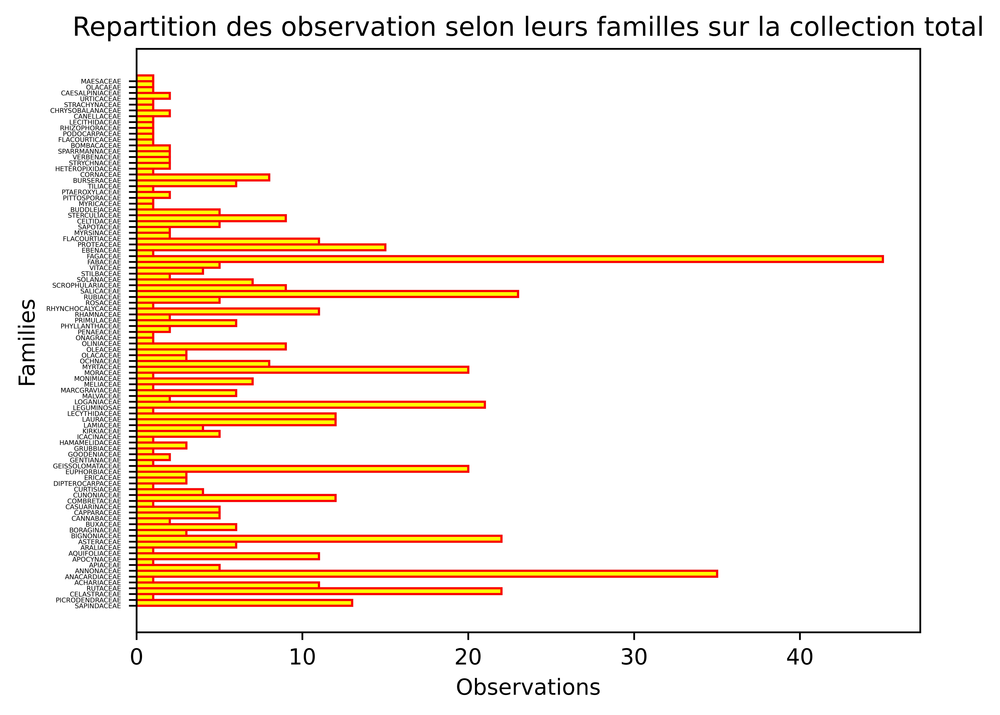

In [22]:
def get_hist_labels(data_frame_family, title, ylabel, dpi, fontsize):
    unique_family = np.unique(data_frame_family)
    nb_family = len(unique_family)
    plt.figure(dpi=dpi)
    plt.hist(data_frame_family, range = (0, nb_family), bins = nb_family, color = 'yellow', edgecolor = 'red', orientation='horizontal')
    plt.xlabel('Observations')
    plt.ylabel(ylabel)
    plt.yticks(fontsize=fontsize)
    plt.title(title)
    plt.savefig(fname)
    plt.show()

fname = "C:/Users/User/Desktop/imagepfe/oralepfeimg4"   
dpi = 1200 # gère le zoom de l'hist
fontsize = 3 # gère la taille des caractères des noms des labels
title = 'Repartition des observation selon leurs familles sur la collection total'
ylabel = 'Families'
hist_label = get_hist_labels(data_frame_family, title, ylabel, dpi, fontsize)
hist_label

In [23]:
title = 'Repartition des observation selon leurs genres sur la collection total'
ylabel = 'genre'
fname = "C:/Users/User/Desktop/imagepfe/oralepfeimg5" 
dpi = 2000 # gère le zoom de l'hist
fontsize = 1 # gère la taille des caractères des noms des labels
hist_label = get_hist_labels(data_frame_genus, title, ylabel, dpi, fontsize)
hist_label
#ca ne va pas du tout on peut rien fair avec ca 

In [24]:
def concatenet_labels_to_features(labels, data_frame):
    data_frame.index = labels
    data_frame = data_frame.reset_index() #We want family to be a column, not the index
    return data_frame

labels = data_frame_family

df = concatenet_labels_to_features(labels, data_frame)
df

,Family,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,45,46,47,48,49,50,52,53,54,56,57,58,60,61,62,63,64,65,66,67,68,69,70,71,72,73,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,130,132,133,134,136,137,138,139,140,141,142,143,144,145,146,148,149,150,151,152,153,154,155,156,157,158,159,160,161
0,SAPINDACEAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,1,1,1,0,1,1,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,PICRODENDRACEAE,1,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,1,0,0,0,1,0,0,1,1,0,0,1,0,0,0,1,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,SAPINDACEAE,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,CELASTRACEAE,0,1,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,1,1,1,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,RUTACEAE,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
528,COMBRETACEAE,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
529,FABACEAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
530,ANACARDIACEAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
531,EBENACEAE,1,1,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,0,0,0,1,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


## 3. Visualisation des données et tentative de détection des caractéristiques discriminantes


* petite phrase d'intro pour énocer notre téchnique pour visualiser les données en 2 dimension , grace à la téchnique de réduction de la dimentionnalité induit par le PCA


## Sommaire de la troisième partie
1. [Visualisation de nos données non balancés](#1.-Visualisation-de-nos-données-non-balancés)
2. [Tentative d'identification de la bonne variable d'observation pour l'identification de cluster dans le data set complet par la méthode co clustering](#2.-Tentative-d'identification-de-la-bonne-variable-d'observation-pour-l'identification-de-cluster-dans-le-data-set-complet-par-la-méthode-co-clustering)
3. [Données IAWA et tentative de visualisation de cluster ](#3.-Données-IAWA-et-tentative-de-visualisation-de-cluster) 

##### 1. Visualisation de nos données non balancés

* Nous allons implémenter une fonction "plot_2D_with_pca" qui va:
          - faire une réduction de la dimentionnalité de nos données en appliquant un PCA à 2 composante (Expliquer mathématique la PCA)
          - puis plot 2D

réduction de la dimensionnalité à 2 dimension. La variabilité expliqué par ces 2 composantes est de: 0.24423053120934574


C:\Users\User\anaconda3\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 7680x5760 with 0 Axes>

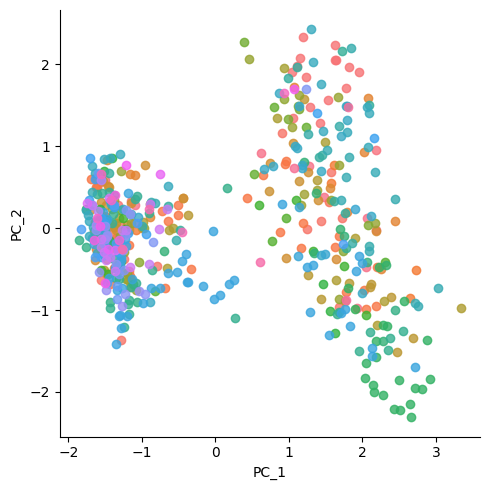

In [25]:
def plot_2D_with_pca(data_frame, labels, dpi, legende): 
    pca2 = PCA(n_components=2)
    X_pca2 = pca2.fit(data_frame).transform(data_frame)
    Y = labels
    print("réduction de la dimensionnalité à 2 dimension. La variabilité expliqué par ces 2 composantes est de: " + str(np.sum(pca2.explained_variance_ratio_)))
    plt.figure(dpi=dpi)
    Y_pca2 = np.c_[Y,X_pca2]
    Y_pca2_df = pd.DataFrame(Y_pca2)
    Y_pca2_df.columns = ["Family","PC_1","PC_2"]
    sns.lmplot( x="PC_1", y="PC_2", data=Y_pca2_df, fit_reg=False, hue="Family", legend=legende)
    #plt.legend(loc='best')  # 'upper center', 'lower center', 'center left', 'center right'  'upper left', 'upper right', 'lower left', 'lower right'
    plt.savefig(fname)
    plt.show()
    
fname = "C:/Users/User/Desktop/imagepfe/oralepfeimg6"
dpi = 1200  
labels = data_frame_family  # <== remplire
legende = False
    
res = plot_2D_with_pca(data_frame, labels, dpi, legende)  #Attention data_frame ne doit pas avoir de labels uniquement les features   
res


réduction de la dimensionnalité à 2 dimension. La variabilité expliqué par ces 2 composantes est de: 0.24423053171612852


C:\Users\User\anaconda3\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 7680x5760 with 0 Axes>

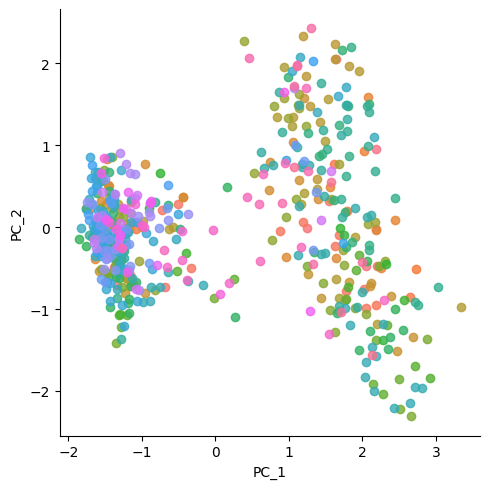

In [26]:
dpi = 1200  
labels = data_frame_genus  # <== remplire
legende = False
fname = "C:/Users/User/Desktop/imagepfe/oralepfeimg7"
    
res = plot_2D_with_pca(data_frame, labels, dpi, legende)  #Attention data_frame ne doit pas avoir de labels uniquement les features   
res

##### 2. Tentative d'identification de la bonne variable d'observation pour l'identification de cluster dans le data set complet par la méthode co clustering

In [27]:
def delete_row_and_col_empety(data_frame, labels):
    # suppression de toutes les colonnes nulle
    data_frame = data_frame.loc[:, (data_frame != 0).any(axis=0)] 
    X = data_frame.iloc[:,:].to_numpy() #df.iloc[:,1:].to_numpy()
    #suppressions des lignes composé uniquement de 0 
    res = np.where(np.sum(X, axis = 1) == 0)[0]
    X = np.delete(X, list(res), axis=0) 
    labels = np.delete(labels, list(res), axis=0)
    return X, labels, res
    

data_frame = data_frame
labels = data_frame_family
print("1 : " + str(data_frame.shape))
print("2 : " + str(data_frame_family.shape))
X, Y, res = delete_row_and_col_empety(data_frame, labels)
print("3 : " + str(X.shape))
print("4 : " + str(Y.shape))

1 : (533, 147)
2 : (533,)
3 : (526, 144)
4 : (526,)


In [28]:
res

array([164, 166, 239, 308, 323, 342, 483], dtype=int64)

In [29]:
#X = df.iloc[:,1:].to_numpy()

In [30]:
#suppressions des lignes composé uniquement de 0 
#res = np.where(np.sum(X, axis = 1) == 0)[0]
#X = np.delete(X, list(res), axis=0)

* trouvons le bon n_cluster 

C:\Users\User\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\User\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\User\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\User\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows wi

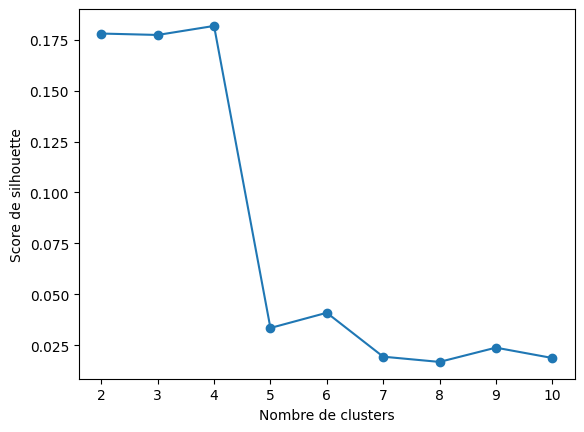

4


4

In [31]:
def n_cluster_optimal_silhouette(X, n_clusters_range, randomstate):
    silhouette_scores = []
    for n_clusters in n_clusters_range:
        spectral_co_clustering = SpectralCoclustering(n_clusters=n_clusters, random_state=randomstate) #random state
        spectral_co_clustering.fit(X)
        silhouette_score_ = silhouette_score(X, spectral_co_clustering.row_labels_)
        silhouette_scores.append(silhouette_score_)
    plt.plot(n_clusters_range, silhouette_scores, marker='o')
    plt.xlabel('Nombre de clusters')
    plt.ylabel('Score de silhouette')
    plt.savefig(fname)
    plt.show()
    # Le nombre optimal de clusters sera celui qui a le score de silhouette le plus élevé
    optimal_n_clusters = n_clusters_range[np.argmax(silhouette_scores)]
    print(optimal_n_clusters)
    return optimal_n_clusters


fname = "C:/Users/User/Desktop/imagepfe/oralepfeimg8"
randomstate = 0
n_clusters_range = range(2, 11)
graph = n_cluster_optimal_silhouette(X, n_clusters_range, randomstate)
graph 

* interprétation 

La métrique qu'on a utilise ici est le score silhouette. On peut voir assez clairement que le nombre optimal de cluster est 2 ou 4. Par la suite nous allons expliquer plus en détails pourquoi on obtient un tel résultat.

In [32]:
#optimal_n_clusters = graph

In [33]:
#clustering = SpectralCoclustering(n_clusters=optimal_n_clusters, random_state=0).fit(X)

Dans ce code, nous utilisons la fonction make_blobs de scikit-learn pour générer des données de test simulées, puis initialisons un modèle de co-clustering à l'aide de la classe SpectralCoclustering. Le modèle est ensuite entraîné avec les données, et les permutations des lignes et des colonnes sont récupérées à l'aide des propriétés row_labels_ et column_labels_. Enfin, les données permutées sont visualisées à l'aide de la bibliothèque matplotlib.

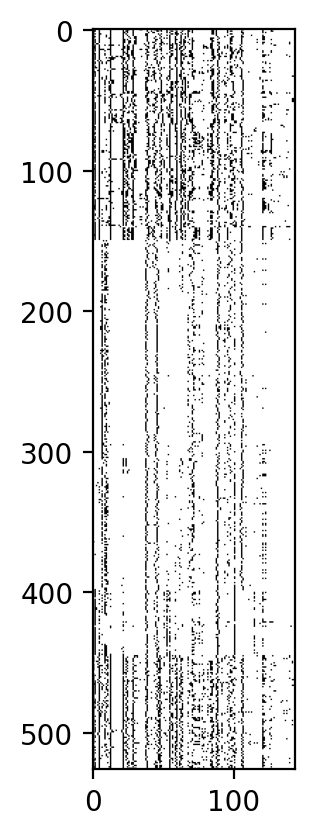

In [34]:
# visualisation de la matrice non permuté


def show_matrix_clusturing(X):
    # visualisation de la matrice non permuté
    img = Image.fromarray((X * 255).astype(np.uint8)) # transformation de la matrice en image
    plt.figure(dpi=200)
    plt.imshow(img, cmap='binary') #visualisation de l'image
    
    
show_matrix_clusturing(X)

In [35]:
# visualisation de la matrice non permuté
#img = Image.fromarray((X * 255).astype(np.uint8)) # transformation de la matrice en image
#plt.figure(dpi=200)
#plt.imshow(img, cmap='binary') #visualisation de l'image

In [36]:
df

,Family,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,45,46,47,48,49,50,52,53,54,56,57,58,60,61,62,63,64,65,66,67,68,69,70,71,72,73,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,130,132,133,134,136,137,138,139,140,141,142,143,144,145,146,148,149,150,151,152,153,154,155,156,157,158,159,160,161
0,SAPINDACEAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,1,1,1,0,1,1,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,PICRODENDRACEAE,1,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,1,0,0,0,1,0,0,1,1,0,0,1,0,0,0,1,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,SAPINDACEAE,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,CELASTRACEAE,0,1,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,1,1,1,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,RUTACEAE,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
528,COMBRETACEAE,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
529,FABACEAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
530,ANACARDIACEAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
531,EBENACEAE,1,1,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,0,0,0,1,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [37]:
data_frame

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,45,46,47,48,49,50,52,53,54,56,57,58,60,61,62,63,64,65,66,67,68,69,70,71,72,73,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,130,132,133,134,136,137,138,139,140,141,142,143,144,145,146,148,149,150,151,152,153,154,155,156,157,158,159,160,161
Family,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
SAPINDACEAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,1,1,1,0,1,1,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
PICRODENDRACEAE,1,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,1,0,0,0,1,0,0,1,1,0,0,1,0,0,0,1,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
SAPINDACEAE,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
CELASTRACEAE,0,1,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,1,0,1,1,1,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
RUTACEAE,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
COMBRETACEAE,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,1,1,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
FABACEAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
ANACARDIACEAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [38]:
def permute_col_and_row_matrix_with_clustering(graph, X, Y):
    optimal_n_clusters = graph
    clustering = SpectralCoclustering(n_clusters=optimal_n_clusters, random_state=0).fit(X)
    #changer le noms de colones et des lignes puis trier dans l'ordre croissant
    # Attention ici je dois permuter les lignes et les colones avec les labels !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!! 
    df_ = pd.DataFrame(X)#conversion de notre matrix en df
    df_.columns = clustering.column_labels_#changeons les noms des colones
    df_ = df_.sort_index(axis=1)#trions
    ######ajoutons les labels
    df_ = concatenet_labels_to_features(Y, df_)
    #########
    df_.index = clustering.row_labels_#changeons les noms des lignes  spectral_co_clustering.row_labels_
    df_ = df_.sort_index(axis=0)
    return df_


df_permute = permute_col_and_row_matrix_with_clustering(graph, X, Y)






##################################
## Le résultat est tres bizzare ##
##################################

C:\Users\User\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


In [39]:
df_permute.iloc[:,1:].to_numpy()

array([[0, 0, 0, ..., 1, 0, 0],
       [0, 1, 0, ..., 1, 0, 0],
       [0, 0, 0, ..., 1, 0, 0],
       ...,
       [0, 0, 0, ..., 1, 0, 0],
       [0, 0, 0, ..., 1, 0, 0],
       [0, 1, 0, ..., 1, 0, 0]])

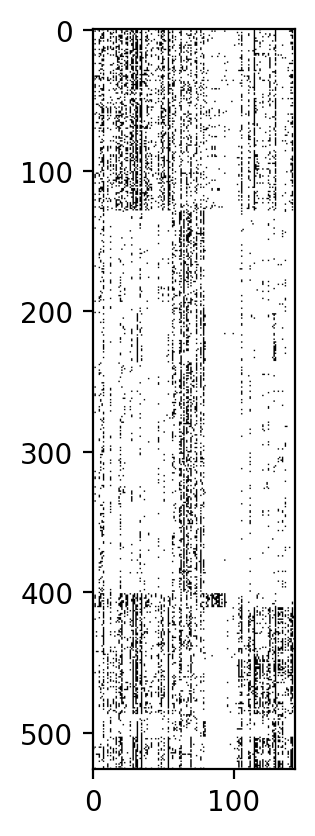

In [40]:
#X_ = df_.iloc[:,1:].to_numpy()

def show_matrix_clusturing_2(df_): #df_ est la sortie de la fonction _test2_
    #X_ = delete_row_and_col_empety(df_, )
    df_ = df_.iloc[:,1:].to_numpy()
    img = Image.fromarray((df_ * 255).astype(np.uint8)) # transformation de la matrice en image
    # Inverser les valeurs dans l'image
    #inverted_image = np.invert(img)
    plt.figure(dpi=200)
    plt.imshow(img, cmap='binary')
 

df_ = df_permute
show_matrix_clusturing_2(df_)

In [41]:
data_frame_collection

0                  IAWA
1                  IAWA
2                  IAWA
3                  IAWA
4                  IAWA
             ...       
528    Wits ESI / CEPAM
529    Wits ESI / CEPAM
530    Wits ESI / CEPAM
531    Wits ESI / CEPAM
532    Wits ESI / CEPAM
Name: Collection, Length: 533, dtype: object

In [42]:
labels

0          SAPINDACEAE
1      PICRODENDRACEAE
2          SAPINDACEAE
3         CELASTRACEAE
4             RUTACEAE
            ...       
528       COMBRETACEAE
529           FABACEAE
530      ANACARDIACEAE
531          EBENACEAE
532          MYRTACEAE
Name: Family, Length: 533, dtype: object

In [43]:
# Ici on vient de réorganiser la matrice des features, nous allons 
# également fair la meme opération sur les labels afin que les 
# labels et les features correspondent



def réorganisation_labels_clustering(labels_collection, res, graph, X):
    optimal_n_clusters = graph
    clustering = SpectralCoclustering(n_clusters=optimal_n_clusters, random_state=0).fit(X)
    #changer le noms de colones et des lignes puis trier dans l'ordre croissant 
    y = labels_collection.to_numpy() #data_frame_collection.to_numpy()
    #suppressions des lignes composé uniquement de 0 
    #res = np.where(np.sum(X, axis = 1) == 0)[0]
    y = np.delete(y, list(res), axis=0)
    df_labels = pd.DataFrame(y)
    df_labels.index = clustering.row_labels_#changeons les noms des lignes
    df_labels = df_labels.sort_index(axis=0)
    return df_labels

labels_collection =  data_frame_collection
df_labels = réorganisation_labels_clustering(labels_collection, res, graph, X)
df_labels

C:\Users\User\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


,0
0,IAWA
0,IAWA
0,IAWA
0,Wits ESI / CEPAM
0,IAWA
...,...
3,IAWA
3,IAWA
3,IAWA
3,IAWA


In [44]:
optimal_n_clusters = graph
for i in range(optimal_n_clusters):
    r = df_labels[df_labels.index == i]
    counts = r[0].value_counts()
    print(counts)
    print("_______________________________________")

0
IAWA                75
Wits ESI / CEPAM    49
Wits ESI             5
Name: count, dtype: int64
_______________________________________
0
Wits ESI    272
Name: count, dtype: int64
_______________________________________
0
IAWA    10
Name: count, dtype: int64
_______________________________________
0
IAWA                65
Wits ESI / CEPAM    32
Wits ESI            18
Name: count, dtype: int64
_______________________________________


réduction de la dimensionnalité à 2 dimension. La variabilité expliqué par ces 2 composantes est de: 0.24423053031007472


C:\Users\User\anaconda3\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 7680x5760 with 0 Axes>

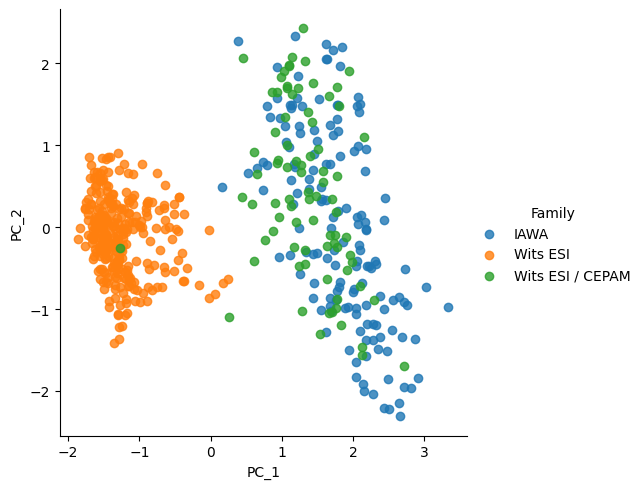

In [45]:
fname = "C:/Users/User/Desktop/imagepfe/oralepfeimg10"
redpi = 1200 
labels = data_frame_collection
legende = True
resu = plot_2D_with_pca(data_frame, labels, dpi, legende)  #Attention data_frame ne doit pas avoir de labels uniquement les features   
resu

##### 3. Données IAWA et tentative de visualisation de cluster 

In [46]:
# on recommence tout 
#PATH = "SACharcoalCollectionFeatures_EP_24_.06.22.csv" #  <=====  Remplire
PATH = "C:/Users/User/Documents/SACharcoalCollectionFeatures_EP_24_.06.22.csv" #  <=====  Remplire
header = 5  # <=====  Remplire
data_IAWA = import_data(PATH, header)

importation d'une data frame de taille (605, 202)


In [47]:
features_mean = ['44 - Mean tangential diameter (¾m)', '51 - Mean vessel density (V/mm? )', '55 - Mean vessel element length (¾m)', '116b - Mean ray / mm']
#collection = ('IAWA', 'Wits ESI', 'Wits ESI / CEPAM')
collection = 'IAWA'
#collection = ('IAWA', 'Wits ESI / CEPAM')
col_ref = 'Collection' #  <=====  Remplire
l = '162M - Silica bodies in fibres'
data_frame_IAWA = clean_data(data_IAWA, col_ref, collection, features_mean, l)

dimension data frame initial est:(605, 202)
séléction des lignes de colléction IAWA
Envlever toutes les colonnes à partir de la 162 inclue
suppresion des colonnes mean
suppresion des collonnes vides
suppression des colonnes unnamed
455 lignes vides supprimées
56 colonnes vides ou unnamed supprimées
(150, 146)


In [48]:
labels_1 = 'Family'    #  <=====  Remplire
labels_2 = 'Scientific name'
#list_no_features = ['Collection', 'BPI/20', 'CODE collector', 'Collector', 'Locality', 'Family', 'Scientific name', 'Synonyme', 'Common name']       #  <=====  Remplire
list_no_features = ['Collection', 'Family', 'Scientific name', 'Synonyme'] #liste à modifier selon la colléction choisie

data_frame_family_IAWA = get_labels(data_frame_IAWA, labels_1)
data_frame_genus_IAWA = get_labels(data_frame_IAWA, labels_2)
#data_frame_collection = data_frame['Collection']
data_frame_IAWA = get_features(data_frame_IAWA, list_no_features)

formation des labels de dimmension (150,) à vous de les traiter
formation des labels de dimmension (150,) à vous de les traiter
formation des features, de dimension (150, 142) à vous de les traiter


In [49]:
data_frame_IAWA = clean_column_names(data_frame_IAWA)

noms des colonnes remplacé par leurs valeurs associé avec succés
conversion des noms de collones par leur numeros de référence associé réalisé avec succé
les colonnes on était triées dans l'odre croissant de leurs noms de colonne


In [50]:
data_frame_IAWA = get_data_01iv(data_frame_IAWA)

remplacement des valeurs manquantes les Nan par des 0
replacement des valeurs certaine par 1


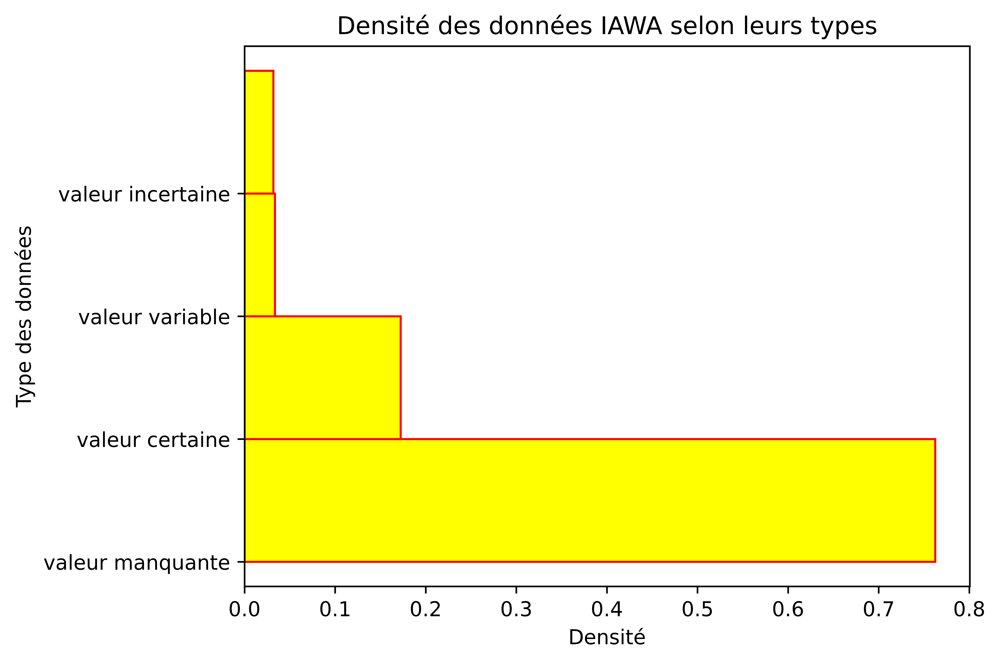

In [51]:
dpi = 1200 # gère le zoom de l'hist
fontsize = 10 # gère la taille des caractères des noms des labels
title = 'Densité des données IAWA selon leurs types'
ylabel = 'Type des données'
xlabel = 'Densité'
data_frame = data_frame_IAWA
fname = "C:/Users/User/Desktop/imagepfe/oralepfeimg11"

hist_obs_type(data_frame)

In [52]:
stats = count_replace(data_frame_IAWA)
stats

1.0
Percentage of (0,1,?,v):  (76.23943661971832, 17.230046948356808, 3.1737089201877935, 3.3568075117370895)


In [53]:
data_frame_IAWA = get_data_01(data_frame_IAWA)
stats = count_replace(data_frame_IAWA)
stats

1.0
Percentage of (0,1,?,v):  (80.41314553990611, 19.586854460093896, 0.0, 0.0)


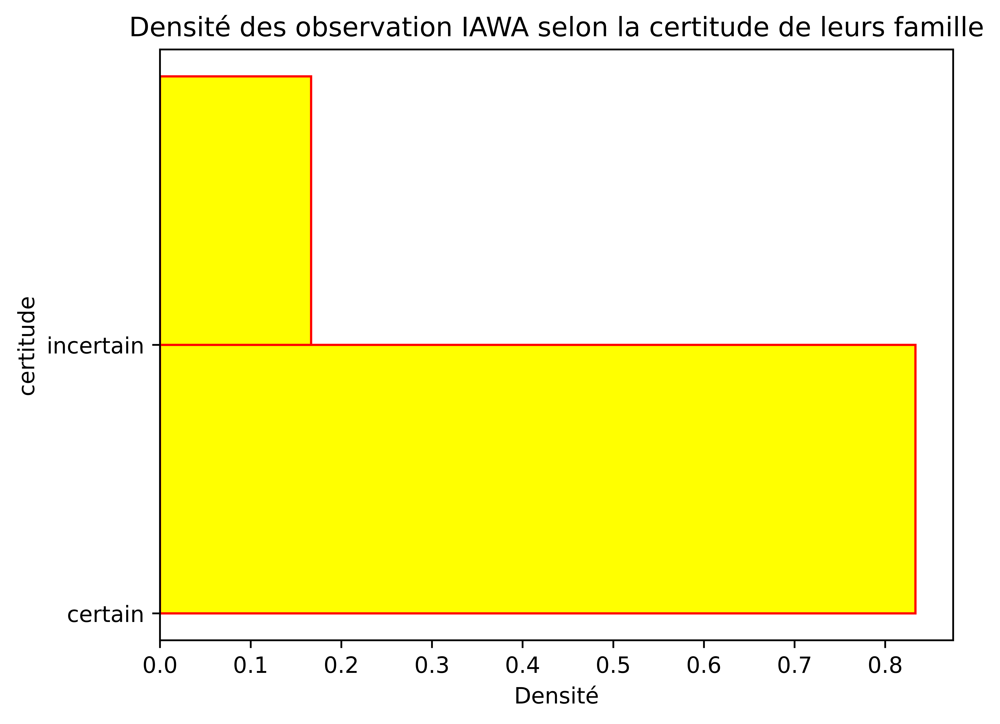

In [54]:
dpi = 1200 # gère le zoom de l'hist
fontsize = 10 # gère la taille des caractères des noms des labels
title = 'Densité des observation IAWA selon la certitude de leurs famille'
ylabel = 'certitude'
xlabel = 'Densité'
labels = data_frame_family_IAWA
fname = "C:/Users/User/Desktop/imagepfe/oralepfeimg12"

hist_obs_certitude(labels)

In [55]:
data_frame_family_IAWA = clean_labels(data_frame_family_IAWA)
data_frame_genus_IAWA = clean_labels(data_frame_genus_IAWA)

Les noms de labels on était réécrit en majuscules
les noms des labels sont composé uniquement du premier mots sans espace à la fin 
Les noms de labels on était réécrit en majuscules
les noms des labels sont composé uniquement du premier mots sans espace à la fin 


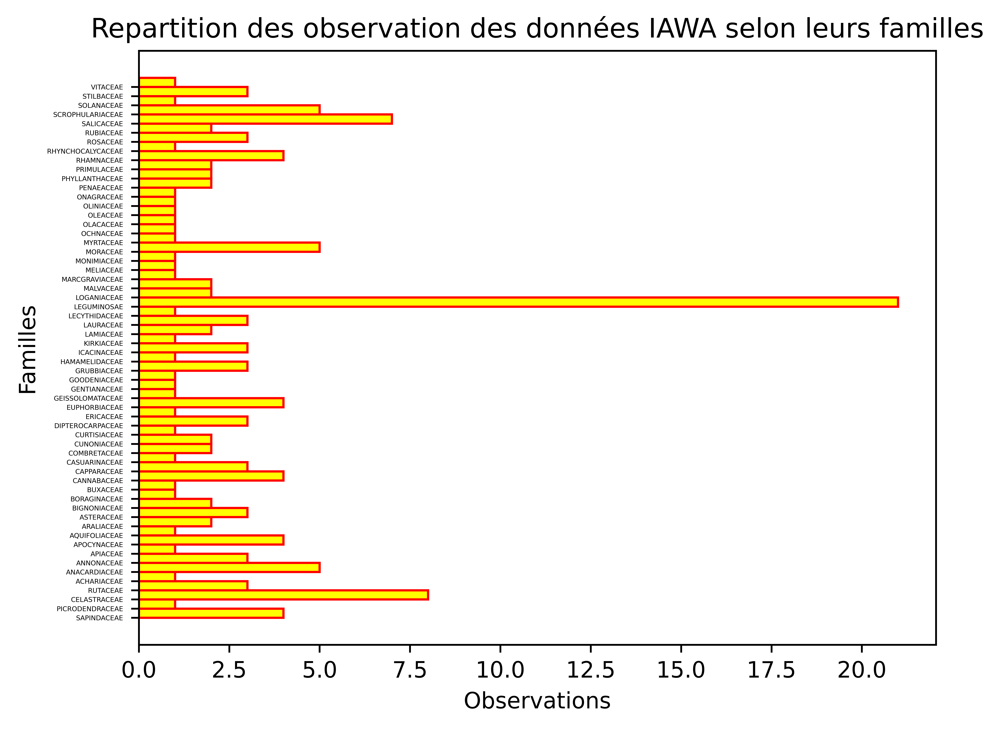

In [56]:
dpi = 1200 # gère le zoom de l'hist
fontsize = 3 # gère la taille des caractères des noms des labels
title = 'Repartition des observation des données IAWA selon leurs familles'
ylabel = 'Familles'
fname = "C:/Users/User/Desktop/imagepfe/oralepfeimg13"
hist_label = get_hist_labels(data_frame_family_IAWA, title, ylabel, dpi, fontsize)
hist_label

In [57]:
title = 'Repartition des observation des données IAWA selon leurs genres'
ylabel = 'genre'
fname = "C:/Users/User/Desktop/imagepfe/oralepfeimg14"
dpi = 2000 # gère le zoom de l'hist
fontsize = 1 # gère la taille des caractères des noms des labels
hist_label = get_hist_labels(data_frame_genus_IAWA, title, ylabel, dpi, fontsize)
hist_label

réduction de la dimensionnalité à 2 dimension. La variabilité expliqué par ces 2 composantes est de: 0.19175686515946988


C:\Users\User\anaconda3\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 7680x5760 with 0 Axes>

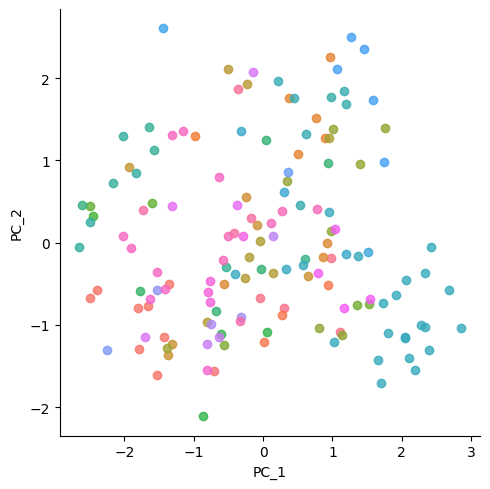

In [58]:
dpi = 1200  
labels = data_frame_family_IAWA  # <== remplire
legende = False
fname = "C:/Users/User/Desktop/imagepfe/oralepfeimg15"
    
plot = plot_2D_with_pca(data_frame_IAWA, labels, dpi, legende)  #Attention data_frame ne doit pas avoir de labels uniquement les features   
plot

In [59]:
labels = data_frame_family_IAWA

df_IAWA = concatenet_labels_to_features(labels, data_frame_IAWA)
df_IAWA

,Family,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,45,46,47,48,49,50,52,53,54,56,57,58,60,61,62,63,64,65,66,67,68,69,70,71,72,73,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,112,113,114,115,116,117,118,119,120,121,122,124,125,130,132,133,134,136,137,138,139,140,141,142,143,144,145,146,148,149,150,151,152,153,154,155,156,159,160
0,SAPINDACEAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,1,0,1,1,0,0,0,1,0,1,0,0,0,1,1,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,PICRODENDRACEAE,1,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,1,1,0,1,0,0,0,1,0,0,1,1,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,SAPINDACEAE,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,CELASTRACEAE,0,1,0,0,1,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,1,1,1,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,RUTACEAE,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,LEGUMINOSAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
146,LEGUMINOSAE,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
147,LEGUMINOSAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
148,LEGUMINOSAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,1,1,0,1,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [60]:
#supprimons les familles sous représenté

In [61]:
def supp_classes_faibles(minim, df):# minim est le nombre min d'échantiollon qu'on veut par classe
                                            # et df doit etre le data frame avec les labels et features
    unique, counts = np.unique(df['Family'], return_counts=True)#unique est une liste avec tous labels sans répétition
                                                                #counts est une liste avec le nombre d'échantillon associé à chaque classe
    store = np.where(counts > minim)[0]# un np.array avec tous les indices qui ont plus de 4 échantillon
    goal_families = np.unique(df['Family'])[store]# dans np.unique(df['Family']) on prend toutes les classes qui ont plus de 4 échantillons
    #print(len(goal_families))
    # pos is the position of all the families with more than 4 elts in the data_frames
    # that is, the position of the 40 remainings families
    pos = [idx for idx in range(df.shape[0]) if df['Family'][idx] in goal_families]
    X = df.loc[pos, df.columns != 'Family'] #suppressions des familles sous représenté  
    Y = df['Family'][pos]
    df = concatenet_labels_to_features(Y, X)
    return df
    
      
minim = 2

df_IAWA = supp_classes_faibles(minim, df_IAWA)

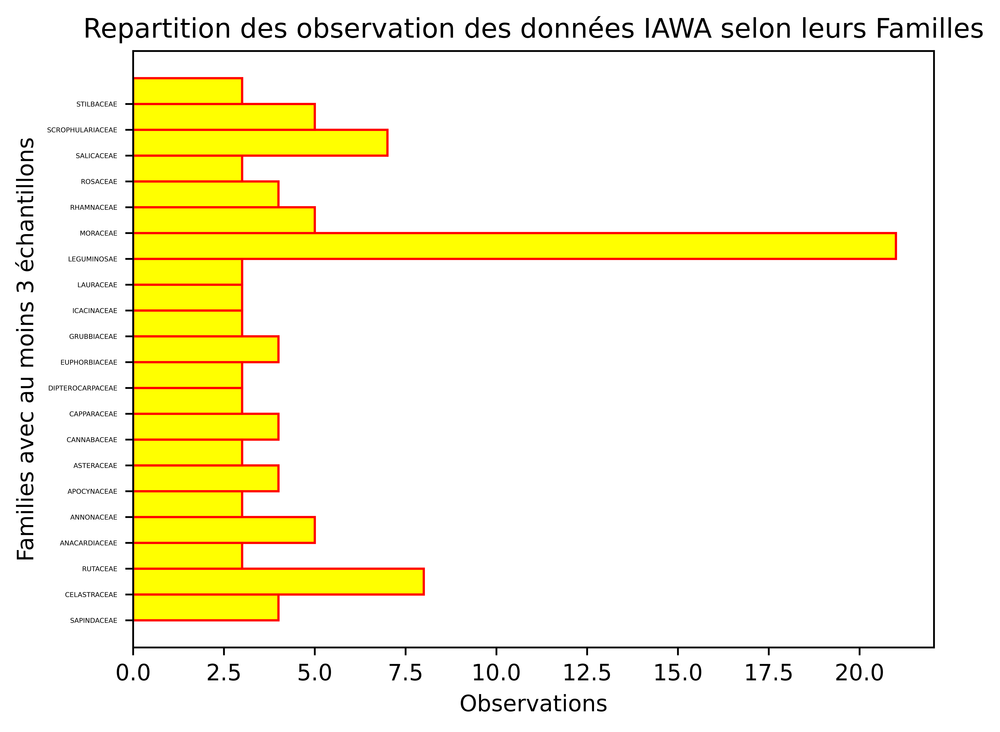

In [62]:
dpi = 1200 # gère le zoom de l'hist
fontsize = 3 # gère la taille des caractères des noms des labels
title = 'Repartition des observation des données IAWA selon leurs Familles'
ylabel = 'Families avec au moins 3 échantillons'
fname = "C:/Users/User/Desktop/imagepfe/oralepfeimg16"
hist_label = get_hist_labels(df_IAWA['Family'], title, ylabel, dpi, fontsize)
hist_label

In [63]:
df_IAWA.iloc[:,1:]

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,45,46,47,48,49,50,52,53,54,56,57,58,60,61,62,63,64,65,66,67,68,69,70,71,72,73,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,112,113,114,115,116,117,118,119,120,121,122,124,125,130,132,133,134,136,137,138,139,140,141,142,143,144,145,146,148,149,150,151,152,153,154,155,156,159,160
0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,1,0,1,1,0,0,0,1,0,1,0,0,0,1,1,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,1,0,0,1,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,1,1,1,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
97,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
98,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
99,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,1,1,0,1,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


réduction de la dimensionnalité à 2 dimension. La variabilité expliqué par ces 2 composantes est de: 0.2158918449417466


C:\Users\User\anaconda3\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 7680x5760 with 0 Axes>

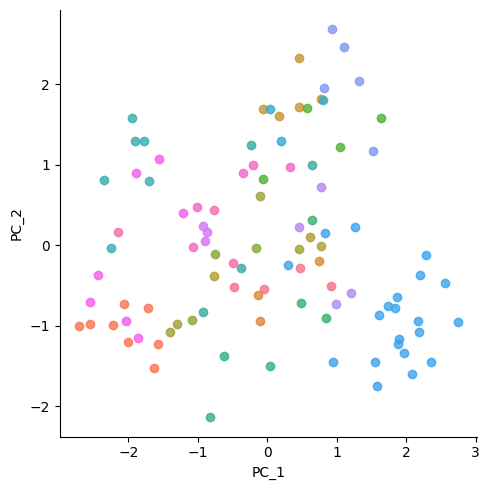

In [64]:
dpi = 1200  
labels = df_IAWA['Family']  # <== remplire
legende = False
fname = "C:/Users/User/Desktop/imagepfe/oralepfeimg17"
    
plot = plot_2D_with_pca(df_IAWA.iloc[:,1:], labels, dpi, legende)  #Attention data_frame ne doit pas avoir de labels uniquement les features   
plot

* identification des cluster reussi

# JE SUIS LA 

#### SpectralCoclustering sur nos données IAWA traité

In [57]:
# suppression de toutes les colonnes nulle
df = df_IAWA.loc[:, (df_IAWA != 0).any(axis=0)]   

In [58]:
X = df.iloc[:,1:].to_numpy()

In [59]:
#suppressions des lignes composé uniquement de 0 
res = np.where(np.sum(X, axis = 1) == 0)[0]
X = np.delete(X, list(res), axis=0)

C:\Users\User\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\User\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\User\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\User\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows wi

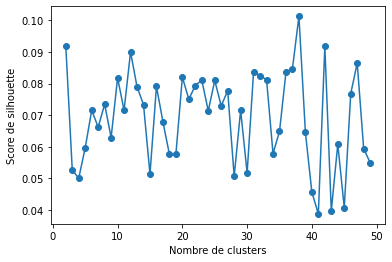

38


38

In [60]:
randomstate = 0
n_clusters_range = range(2, 50)
fname = "C:/Users/User/Desktop/imagepfe/oralepfeimg18"
graph = n_cluster_optimal_silhouette(X, n_clusters_range, randomstate)
graph 

Selon le score de silhouette, le nombre optimal de clusters est ici de n. Cependant, on obeserve des scores quasiment similaires pour 2 clusters, comme pour d'autres quantitées. Il est donc naturellement assez difficile de donner une interprétation claire à ce que devrait être le meilleur nombre de clusters selon le score de silhouette. Cela peut en revanche montrer à quel point nos données sont variables est difficilement classifiable par apprentissage automatique.

In [61]:
optimal_n_clusters = graph

In [62]:
clustering = SpectralCoclustering(n_clusters=optimal_n_clusters, random_state=0).fit(X)

C:\Users\User\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


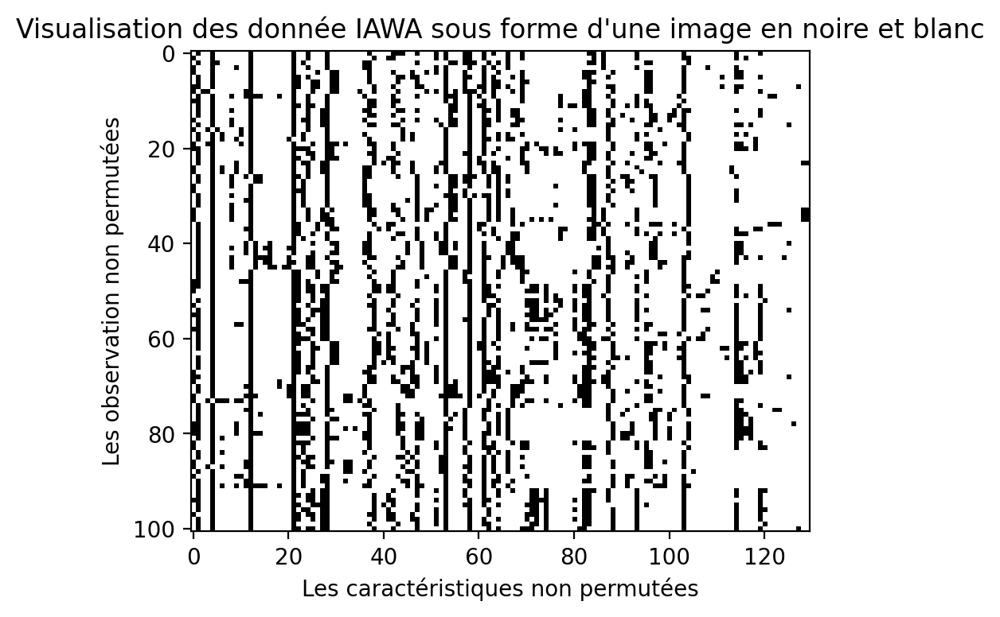

In [63]:
# visualisation de la matrice non permuté
img = Image.fromarray((X * 255).astype(np.uint8)) # transformation de la matrice en image
fname = "C:/Users/User/Desktop/imagepfe/oralepfeimg19"
title = "Visualisation des donnée IAWA sous forme d'une image en noire et blanc"
xlabel = 'Les caractéristiques non permutées'
ylabel = 'Les observation non permutées'
plt.figure(dpi=200)
plt.xlabel(xlabel)
plt.ylabel(ylabel)
plt.title(title)
#plt.legend(loc='best') ca a pas marché 
plt.savefig(fname)
plt.imshow(img, cmap='binary') #visualisation de l'image

In [64]:
#changer le noms de colones et des lignes puis trier dans l'ordre croissant
#conténation avec les labels 
df_ = pd.DataFrame(X)#conversion de notre matrix en df
df_.columns = clustering.column_labels_#changeons les noms des colones
df_ = df_.sort_index(axis=1)#trions
######ajoutons les labels
y = df_IAWA['Family'].to_numpy()
#suppressions des lignes composé uniquement de 0 
y = np.delete(y, list(res), axis=0)
df_labels = pd.DataFrame(y)
#concatenation des labels avec les features 
df_ = concatenet_labels_to_features(df_labels, df_)
#########
df_.index = clustering.row_labels_#changeons les noms des lignes
df_ = df_.sort_index(axis=0)

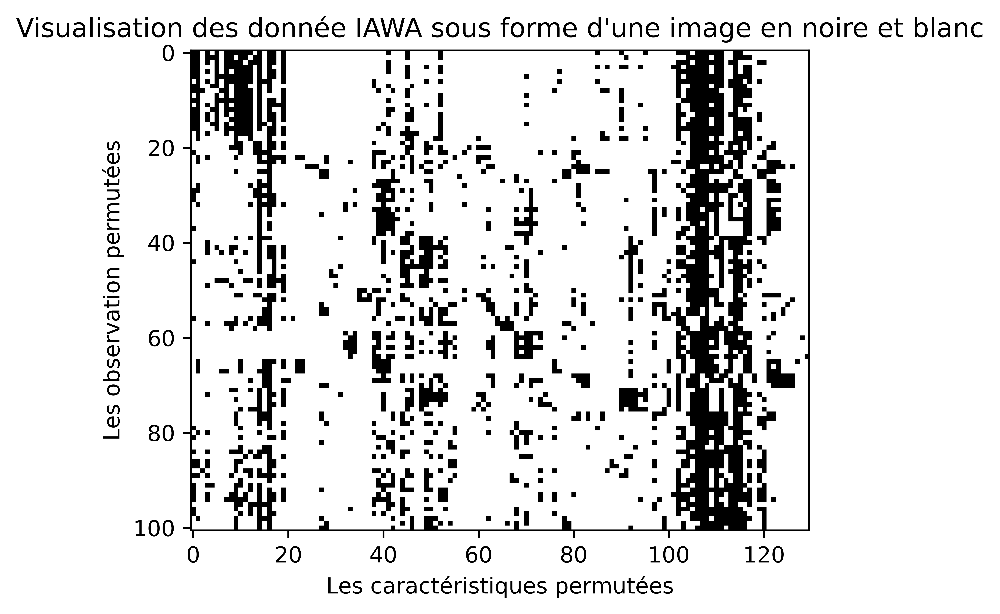

In [65]:
X_ = df_.iloc[:,1:].to_numpy()
img = Image.fromarray((X_ * 255).astype(np.uint8)) # transformation de la matrice en image
# Inverser les valeurs dans l'image
#inverted_image = np.invert(img)
fname = "C:/Users/User/Desktop/imagepfe/oralepfeimg20"
title = "Visualisation des donnée IAWA sous forme d'une image en noire et blanc"
xlabel = 'Les caractéristiques permutées'
ylabel = 'Les observation permutées'
plt.figure(dpi=1200)
plt.xlabel(xlabel)
plt.ylabel(ylabel)
plt.title(title)
#plt.legend(loc='best') ca a pas marché 
plt.savefig(fname)

plt.imshow(img, cmap='binary')

## 4. Apprentissage automatique/statistique


## Sommaire de la quatrième partie

1. [Apprentissage par Arbres de décision](#1.-Apprentissage-par-Arbres-de-décision)
2. [Apprentissage par foret aléatoire d'arbre de décision](#2.-Apprentissage-par-foret-aléatoire-d'arbre-de-décision)
3. [SVM](#3.-SVM)


In [65]:
df_IAWA

,Family,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,45,46,47,48,49,50,52,53,54,56,57,58,60,61,62,63,64,65,66,67,68,69,70,71,72,73,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,112,113,114,115,116,117,118,119,120,121,122,124,125,130,132,133,134,136,137,138,139,140,141,142,143,144,145,146,148,149,150,151,152,153,154,155,156,159,160
0,SAPINDACEAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,1,0,1,1,0,0,0,1,0,1,0,0,0,1,1,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,SAPINDACEAE,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,CELASTRACEAE,0,1,0,0,1,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,1,1,1,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,RUTACEAE,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,ANACARDIACEAE,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,LEGUMINOSAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
97,LEGUMINOSAE,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
98,LEGUMINOSAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
99,LEGUMINOSAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,1,1,0,1,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [65]:
data = df_IAWA

In [66]:
# on split
X = data.loc[:, data.columns != 'Family']
Y = data[['Family']]
split = 0.3 # on peut le modifier c'est pas un prblm
Xtrain, Xtest, ytrain, ytest = train_test_split(X, Y, test_size=split, random_state=0)

##### 1. Apprentissage par Arbres de décision

In [66]:
def nouvelle_liste_avec_arret(liste, n):
    nouvelle_liste = [liste[0]]  # Initialisez la nouvelle liste avec le premier élément de la liste d'origine
    diminution_count = 0  # Compteur pour suivre le nombre de diminutions consécutives

    for i in range(1, len(liste)):
        if liste[i] >= nouvelle_liste[-1]:
            nouvelle_liste.append(liste[i])
            diminution_count = 0  # Réinitialisez le compteur si la valeur augmente
        else:
            diminution_count += 1
            if diminution_count >= n:
                break  # Arrêtez le processus si la valeur a diminué plus de n fois de suite

    return nouvelle_liste

# Exemple d'utilisation
liste_originale = [1.0, 2.0, 3.0, 2.5, 2.3, 2.2, 2.1, 2.0, 2.5, 2.6, 2.7]
nouvelle_liste = nouvelle_liste_avec_arret(liste_originale, 2)
print(nouvelle_liste)


[1.0, 2.0, 3.0]


In [105]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import load_iris

# Chargez un exemple de jeu de données (remplacez cela par vos propres données)
data = load_iris()
X = data.data
y = data.target

# Créez et ajustez un modèle d'arbre de décision
clf = DecisionTreeClassifier()
clf.fit(X, y)
tree = clf.tree_
print(tree.n_classes)


[3]


In [67]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import load_iris

# Chargez un exemple de jeu de données (remplacez cela par vos propres données)
data = load_iris()
X = data.data
y = data.target

# Créez et ajustez un modèle d'arbre de décision
clf = DecisionTreeClassifier()
clf.fit(X, y)



# Fonction récursive pour récupérer les classes dans les nœuds feuilles
def get_leaf_classes(tree, node_id=0):
    if tree.children_left[node_id] == tree.children_right[node_id]:  # Nœud feuille
        if tree.impurity[node_id] > 0:  # Indice de Gini non nul
            classes_in_leaf = [cls for cls in range(tree.n_classes[0]) if tree.value[node_id][0, cls] > 0]
            if classes_in_leaf:
                return {f"Node {node_id}": classes_in_leaf}
    else:
        left_classes = get_leaf_classes(tree, tree.children_left[node_id])
        right_classes = get_leaf_classes(tree, tree.children_right[node_id])
        
        # Fusionnez les résultats non nuls des nœuds fils
        result = {}
        if left_classes is not None:
            result.update(left_classes)
        if right_classes is not None:
            result.update(right_classes)
        return result

# Récupérez les classes dans les nœuds feuilles avec un indice de Gini non nul
leaf_classes = get_leaf_classes(clf.tree_)

# Affichez les résultats
for node, classes in leaf_classes.items():
    print(f"{node}: Classes présentes = {classes}")


In [70]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.datasets import load_iris

# Chargez un exemple de jeu de données (remplacez cela par vos propres données)
data = load_iris()
X = data.data
y = data.target

# Créez et ajustez un modèle d'arbre de décision
clf = DecisionTreeClassifier()
clf.fit(X, y)

# Fonction récursive pour récupérer la classe dans les nœuds feuilles avec un indice de Gini de 0
def get_classes_in_zero_gini_leaves(tree, node_id=0):
    if tree.children_left[node_id] == tree.children_right[node_id]:  # Nœud feuille
        if tree.impurity[node_id] == 0:  # Indice de Gini de 0
            class_in_leaf = tree.value[node_id].argmax()  # Trouvez la classe majoritaire
            return {f"Node {node_id}": class_in_leaf}
    else:
        left_classes = get_classes_in_zero_gini_leaves(tree, tree.children_left[node_id])
        right_classes = get_classes_in_zero_gini_leaves(tree, tree.children_right[node_id])
        
        # Fusionnez les résultats non nuls des nœuds fils
        result = {}
        if left_classes is not None:
            result.update(left_classes)
        if right_classes is not None:
            result.update(right_classes)
        return result

# Récupérez les classes dans les nœuds feuilles avec un indice de Gini de 0
zero_gini_classes = get_classes_in_zero_gini_leaves(clf.tree_)

# Affichez les résultats
for node, class_label in zero_gini_classes.items():
    print(f"{node}: Classe représentée = {class_label}")


Node 1: Classe représentée = 0
Node 5: Classe représentée = 1
Node 6: Classe représentée = 2
Node 8: Classe représentée = 2
Node 10: Classe représentée = 1
Node 11: Classe représentée = 2
Node 14: Classe représentée = 1
Node 15: Classe représentée = 2
Node 16: Classe représentée = 2


Splitons notre data set avec la methode train split
Entrainons nos modèles d'arbre de décision en faisant varier sa profondeur
m_depth = 2 : fini

m_depth = 3 : fini

m_depth = 4 : fini

m_depth = 5 : fini

m_depth = 6 : fini

m_depth = 7 : fini

m_depth = 8 : fini

m_depth = 9 : fini

m_depth = 10 : fini

m_depth = 11 : fini

m_depth = 12 : fini

m_depth = 13 : fini

m_depth = 14 : fini

m_depth = 15 : fini

m_depth = 16 : fini

m_depth = 17 : fini

m_depth = 18 : fini

m_depth = 19 : fini

computation time : 0.42
Affichons l'evolution des performances de l'arbre de décision en fonction de sa profondeur sur l'ensemble d'entrainement et sur l'ensemble de teste


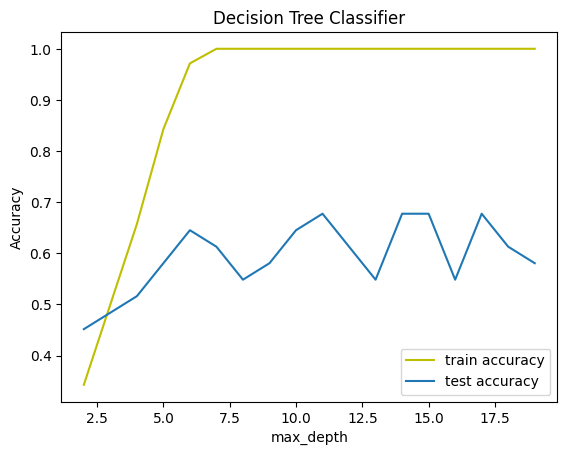

Nous pouvons constater une situation de surapprentissage des que le modèle continue à apprendre/à performer sur l'ensemble d'apprentissage
Alors que ces performances diminue sur l'ensemble de teste. Essayon d'introduire un critère qui stop automatiquement
l'apprentissage lorsque qu'une situation de sur apprentissage est identier
Ce critère va etre de définir que si notre modèle  diminue ces performance n nombre de fois à la suite alors on arrete l'apprentissage


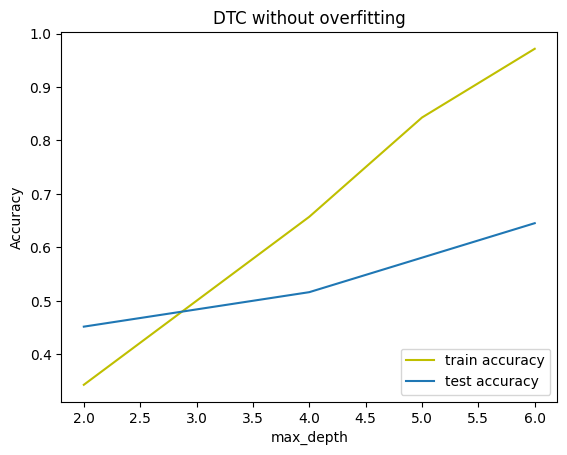

We can see that the depth that maximizes the score accuracy is mdepth =  6 which gives accuracy score of 61.29032258064516 %


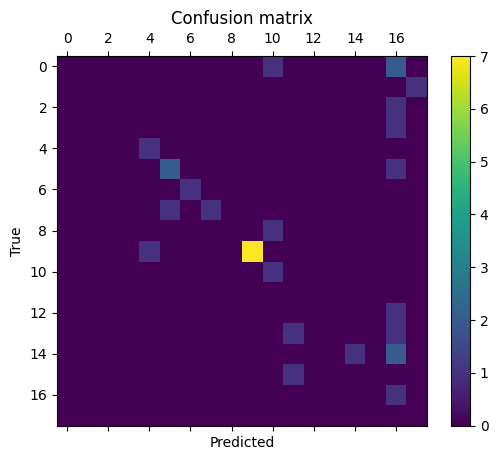

Accuracy:  48.38709677419355 %


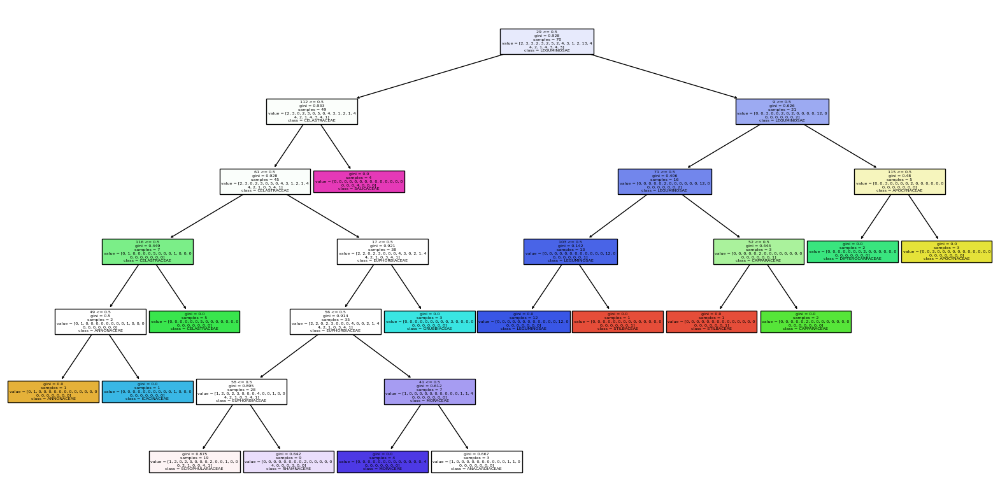

Node 11: Classes présentes = [0, 1, 3, 4, 8, 11, 15, 16, 19, 20]
Node 12: Classes présentes = [8, 14, 18]
Node 15: Classes présentes = [0, 11, 12]
{'Node 11': [0, 1, 3, 4, 8, 11, 15, 16, 19, 20], 'Node 12': [8, 14, 18], 'Node 15': [0, 11, 12]}
Node 5: Classe représentée = 1
Node 6: Classe représentée = 10
Node 7: Classe représentée = 6
Node 14: Classe représentée = 13
Node 16: Classe représentée = 9
Node 17: Classe représentée = 17
Node 21: Classe représentée = 12
Node 22: Classe représentée = 20
Node 24: Classe représentée = 20
Node 25: Classe représentée = 5
Node 27: Classe représentée = 7
Node 28: Classe représentée = 2
{'Node 5': 1, 'Node 6': 10, 'Node 7': 6, 'Node 14': 13, 'Node 16': 9, 'Node 17': 17, 'Node 21': 12, 'Node 22': 20, 'Node 24': 20, 'Node 25': 5, 'Node 27': 7, 'Node 28': 2}


In [76]:
### from time import time

# Ici nous allons evaluer la performance d'un modèle d'apprentisasger automatique qui est l'arbre de décision 
# Nous allons evaluer ces performances en faisant varier la profondeur de l'arbre (plus de précision d'en le rapport)
# Ainsi nous allons retourner un graphique qui trace la performance de l'abre en fonction de sa profondeur 
# sur l'echantillion d'entrainement et sur l'echantillon de teste



def Modele_arbreDecision(min_mdepth, max_mdepth, data, split, stop_app):
    data = df_IAWA
    
    print("Splitons notre data set avec la methode train split") 
    X = data.loc[:, data.columns != 'Family']
    Y = data[['Family']]
    Xtrain, Xtest, ytrain, ytest = train_test_split(X, Y, test_size=split, random_state=0)
    
    print("Entrainons nos modèles d'arbre de décision en faisant varier sa profondeur")
    acc_train_dt = []
    acc_test_dt = []
    t1 = time()
    for mdepth_dt in np.arange(min_mdepth,max_mdepth,1):
        clf_dt = DecisionTreeClassifier(criterion='entropy',max_depth=mdepth_dt)
        clf_dt = clf_dt.fit(Xtrain, ytrain)
        acc_train_dt.append(clf_dt.score(Xtrain, ytrain))
        acc_test_dt.append(clf_dt.score(Xtest, ytest))
        print('m_depth = ' + str(mdepth_dt) + ' : fini\n')#MODIFIER
    t2 = time()
    print('computation time : ' + str(round(t2-t1,2)))
    
    print("Affichons l'evolution des performances de l'arbre de décision en fonction de sa profondeur sur l'ensemble d'entrainement et sur l'ensemble de teste") 
    plt.plot(np.arange(2,20,1), acc_train_dt, 'y', label = 'train accuracy')
    plt.plot(np.arange(2,20,1), acc_test_dt, label ='test accuracy')
    plt.legend(loc='lower right')
    plt.title('Decision Tree Classifier')
    plt.xlabel('max_depth')
    plt.ylabel('Accuracy')
    plt.savefig("C:/Users/User/Desktop/imagepfe/oralepfeimg21")
    #plt.savefig('C:/Users/User/Documents/image1')
    plt.show()
    
    
    
    ####      ATTTENTION JE DOIS CHANGER LA METHODE POUR IDENTIFIER LE SURAPPRENTISSAGE 
    # critère 1: le sur apprentissage correspond au moment ou le modèle continue à apprendre sur l'entrainement mais pas sur le teste
    # critère 2: ...............
    
    
    print("Nous pouvons constater une situation de surapprentissage des que le modèle continue à apprendre/à performer sur l'ensemble d'apprentissage")
    print("Alors que ces performances diminue sur l'ensemble de teste. Essayon d'introduire un critère qui stop automatiquement")
    print("l'apprentissage lorsque qu'une situation de sur apprentissage est identier")
    print("Ce critère va etre de définir que si notre modèle  diminue ces performance n nombre de fois à la suite alors on arrete l'apprentissage")
    
    #___________________________________ MODIFIER_____________________________________________________________
    
    #(i.e accuracy sur le train = 1)    MAUVAIS CRITERE
    # Ici on à 2 listes des accuracy des arbres en fonction de leur profondeurs sur le train et le teste
    # nous allons récupérer l'indice 
    
    acc_test_dt_mod = nouvelle_liste_avec_arret(acc_test_dt, 3)
    taille = len(acc_test_dt_mod)
    acc_train_dt_mod = acc_train_dt[:taille]
    plt.plot(np.arange(2,len(acc_train_dt_mod) + 2,1), acc_train_dt_mod, 'y', label = 'train accuracy')
    plt.plot(np.arange(2,len(acc_test_dt_mod) + 2,1), acc_test_dt_mod, label ='test accuracy')  
    plt.legend(loc='lower right')
    plt.title('DTC without overfitting')
    plt.xlabel('max_depth')
    plt.ylabel('Accuracy')
    #plt.savefig('C:/Users/User/Documents/image2')
    plt.show()

    print("We can see that the depth that maximizes the score accuracy is mdepth = " , len(acc_test_dt_mod) - 1 + 2 , "which gives accuracy score of" ,acc_test_dt[len(acc_test_dt_mod)] * 100 , "%")
    
    
    
    # Affichage de la matrice de confusion 
    
    
    mdepth_optimal_dt = len(acc_test_dt_mod) - 1 + 2   # POURQUOI PLUS 5 
    clf_dt = DecisionTreeClassifier(max_depth = mdepth_optimal_dt)
    clf_dt = clf_dt.fit(Xtrain, ytrain)

    cm_dt = confusion_matrix(ytest, clf_dt.predict(Xtest))
    fig = plt.figure()
    ax = fig.add_subplot(111)
    cax = ax.matshow(cm_dt)
    plt.title('Confusion matrix')
    fig.colorbar(cax)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.savefig("C:/Users/User/Desktop/imagepfe/oralepfeimg19")
    #plt.savefig('C:/Users/User/Documents/image3')
    plt.show()
    
    
    # Afficher l'accurracy avec ce modèle choisie
    accuracy = clf_dt.score(Xtest, ytest)
    #print(accuracy)
    print("Accuracy: ", accuracy * 100 , "%")
    
    

    
    
    
    
    # Affichage de l'arbre 
    
    fname = "C:/Users/User/Desktop/imagepfe/oralepfeimg20"
    # Tracer l'arbre de décision
    plt.figure(figsize=(20,10))
    res = tree.plot_tree(clf_dt, filled=True, feature_names=np.array(df_IAWA.columns)[1:], class_names=np.unique(df_IAWA['Family']))
    plt.savefig(fname)
    plt.show()
    
    
    # Récupérez les classes dans les nœuds feuilles avec un indice de Gini non nul
    leaf_classes = get_leaf_classes(clf_dt.tree_)

    # Affichez les résultats
    for node, classes in leaf_classes.items():
        print(f"{node}: Classes présentes = {classes}")
    
    #####         EXCELLENT MAINTENANT JE DOIS MODIFIER LES LABELS DE MON DATASET PAR RAPPORT AU DERNIER RESULTATS
    ### PUIS J'UTILISE LE MEME MODEL SUR CE NOUVEAU DATASET ET MONTRER QUE J4AI DES MEILLEUR RESULTAT
    
    
    print(leaf_classes)
    
    
    
    
    
    # Récupérez les classes dans les nœuds feuilles avec un indice de Gini de 0
    zero_gini_classes = get_classes_in_zero_gini_leaves(clf_dt.tree_)

    # Affichez les résultats
    for node, class_label in zero_gini_classes.items():
        print(f"{node}: Classe représentée = {class_label}")
        
        
    print(zero_gini_classes)
    
    
    
    # ce qui reste à faire c'est: 
    # 1. tester le meme modèle sur la nouvelle classe 
    
    
    
    

min_mdepth = 2
max_mdepth = 20 
data = df_IAWA
split = 0.3
stop_app = 2

Modele_arbreDecision(min_mdepth, max_mdepth, data, split, stop_app)

In [98]:
node_dict = {'Node 15': [0, 3, 8, 11, 16], 'Node 16': [1, 15]}

# Obtenez toutes les valeurs du dictionnaire sous forme de liste
values_list = list(node_dict.values())

# Spécifiez l'indice de la liste que vous souhaitez récupérer
indice = 1  # par exemple, pour obtenir la première liste [0, 3, 8, 11, 16]

# Récupérez la liste par son indice
desired_list = values_list[indice]

print(desired_list)


[1, 15]


##### 2. Apprentissage par foret aléatoire d'arbre de décision

In [82]:
import time

max_depth=25
n_estimators=50
step_1 = 5 #has to divide max_depth
step_2 = 10 #has to divide n_estimators
rfc_accuracy_test =[]
rfc_accuracy_train = []
rfc_time_fit = []
rfc_time_predict = []
rfc_y_pred_list = []
X = []
Y = []


for i in [x for x in range(0,max_depth+1, step_1) if x!= 0]:
    print('switch_i max_depth: ', i)
    for j in [y for y in range(0, n_estimators+1, step_2) if y !=0]:
        rfc = ensemble.RandomForestClassifier(max_depth=i, n_estimators = j)
        start_fit = time.time()
        rfc.fit(Xtrain, ytrain)
        end_fit = time.time()
        rfc_time_fit.append(end_fit-start_fit)
        print('switch_j n_estimators: ', j)

        start_predict = time.time()
        predicted_train = rfc.predict(Xtrain)
        predicted_test = rfc.predict(Xtest)
        end_predict = time.time()
        rfc_time_predict.append(end_predict-start_predict)
        rfc_y_pred_list.append(predicted_test)
        rfc_accuracy_train.append(accuracy_score(ytrain, predicted_train))
        rfc_accuracy_test.append(accuracy_score(ytest, predicted_test))

        X.append(i)
        Y.append(j)

X = np.array(X)
Y = np.array(Y)
print(X, X.shape)
print(Y, Y.shape)

switch_i max_depth:  5
switch_j n_estimators:  10


C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)
C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)


switch_j n_estimators:  20
switch_j n_estimators:  30


C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)
C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)
C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)


switch_j n_estimators:  40
switch_j n_estimators:  50
switch_i max_depth:  10
switch_j n_estimators:  10


C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)
C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)
C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)


switch_j n_estimators:  20
switch_j n_estimators:  30


C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)


switch_j n_estimators:  40


C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)


switch_j n_estimators:  50
switch_i max_depth:  15
switch_j n_estimators:  10


C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)
C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)
C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)


switch_j n_estimators:  20
switch_j n_estimators:  30


C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)
C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)


switch_j n_estimators:  40
switch_j n_estimators:  50
switch_i max_depth:  20
switch_j n_estimators:  10


C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)
C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)
C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)


switch_j n_estimators:  20
switch_j n_estimators:  30


C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)


switch_j n_estimators:  40


C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)


switch_j n_estimators:  50
switch_i max_depth:  25
switch_j n_estimators:  10


C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)
C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)


switch_j n_estimators:  20
switch_j n_estimators:  30


C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)
C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)
C:\Users\User\AppData\Local\Temp\ipykernel_5856\3655673556.py:21: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfc.fit(Xtrain, ytrain)


switch_j n_estimators:  40
switch_j n_estimators:  50
[ 5  5  5  5  5 10 10 10 10 10 15 15 15 15 15 20 20 20 20 20 25 25 25 25
 25] (25,)
[10 20 30 40 50 10 20 30 40 50 10 20 30 40 50 10 20 30 40 50 10 20 30 40
 50] (25,)


[ 5  5  5  5  5 10 10 10 10 10 15 15 15 15 15 20 20 20 20 20 25 25 25 25
 25] (25,)
[10 20 30 40 50 10 20 30 40 50 10 20 30 40 50 10 20 30 40 50 10 20 30 40
 50] (25,)


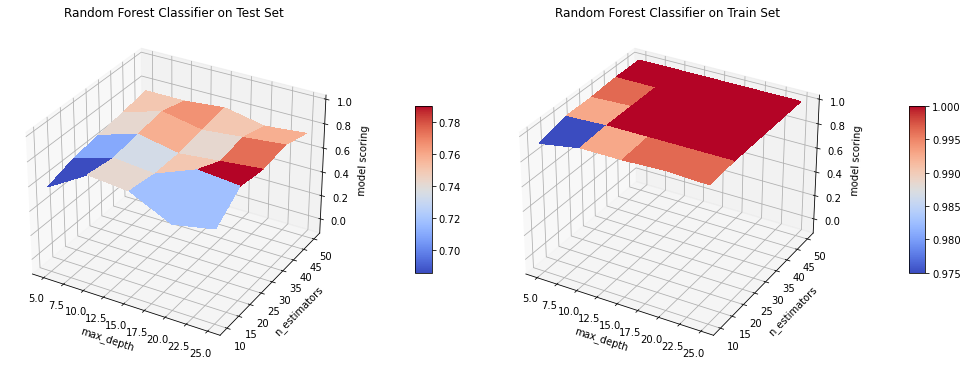

[[ 5  5  5  5  5]
 [10 10 10 10 10]
 [15 15 15 15 15]
 [20 20 20 20 20]
 [25 25 25 25 25]]
[[10 20 30 40 50]
 [10 20 30 40 50]
 [10 20 30 40 50]
 [10 20 30 40 50]
 [10 20 30 40 50]]
[[0.58064516 0.64516129 0.67741935 0.70967742 0.74193548]
 [0.77419355 0.74193548 0.77419355 0.80645161 0.74193548]
 [0.74193548 0.70967742 0.70967742 0.74193548 0.77419355]
 [0.58064516 0.83870968 0.74193548 0.77419355 0.70967742]
 [0.64516129 0.80645161 0.77419355 0.80645161 0.74193548]]


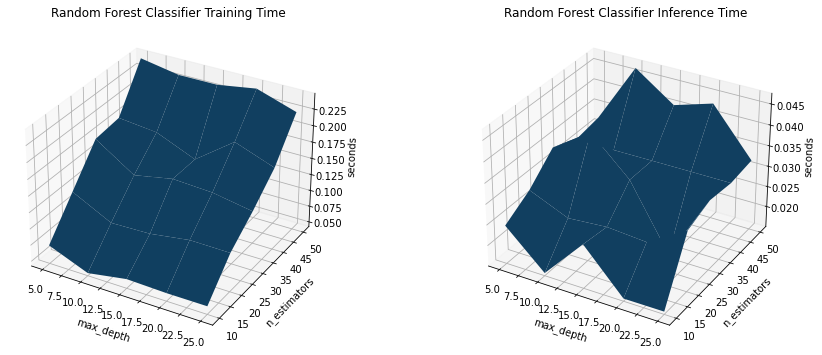

16
[[0.58064516 0.64516129 0.67741935 0.70967742 0.74193548]
 [0.77419355 0.74193548 0.77419355 0.80645161 0.74193548]
 [0.74193548 0.70967742 0.70967742 0.74193548 0.77419355]
 [0.58064516 0.83870968 0.74193548 0.77419355 0.70967742]
 [0.64516129 0.80645161 0.77419355 0.80645161 0.74193548]]
Best estimator for Random Forest Classifier: (max_depth, n_estimators) = [20 20]
Best accuracy for Random Forest Classifier:  0.8387096774193549


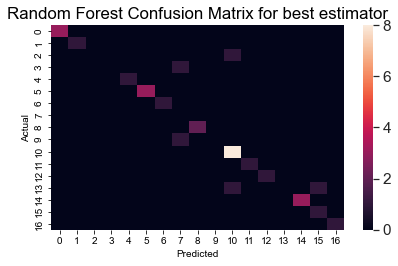

In [83]:
#PLOTS

X = np.array(X)
Y = np.array(Y)
print(X, X.shape)
print(Y, Y.shape)

fig = plt.figure(figsize=(14,5))

#1st subplot

ax = fig.add_subplot(1, 2, 1, projection='3d')

x = np.reshape(X, (int(max_depth/step_1), int(n_estimators/step_2)))
y = np.reshape(Y, (int(max_depth/step_1), int(n_estimators/step_2)))
z1 = np.reshape(np.array(rfc_accuracy_test), (int(max_depth/step_1), int(n_estimators/step_2)))
z2 = np.reshape(np.array(rfc_accuracy_train), (int(max_depth/step_1), int(n_estimators/step_2)))

surf = ax.plot_surface(x, y, z1, rstride=1, cstride=1, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)
ax.set_zlim(-0.1, 1.01)
ax.set_xlabel('max_depth')
ax.set_ylabel('n_estimators')
ax.set_zlabel('model scoring')
ax.set_title('Random Forest Classifier on Test Set')
fig.colorbar(surf, shrink=0.5, aspect=10, pad=0.15)

#2nd subplot

ax = fig.add_subplot(1, 2, 2, projection='3d')

surf2 = ax.plot_surface(x, y, z2, rstride=1, cstride=1, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)
ax.set_zlim(-0.1, 1.01)
ax.set_xlabel('max_depth')
ax.set_ylabel('n_estimators')
ax.set_zlabel('model scoring')
ax.set_title('Random Forest Classifier on Train Set')
fig.colorbar(surf2, shrink=0.5, aspect=10, pad=0.15)

fig.tight_layout()
plt.show()

print(x)
print(y)
print(z1)

rfc_time_fit = np.reshape(np.array(rfc_time_fit), (int(max_depth/step_1), int(n_estimators/step_2)))
rfc_time_predict = np.reshape(np.array(rfc_time_predict), (int(max_depth/step_1), int(n_estimators/step_2)))
x = np.reshape(X, (int(max_depth/step_1), int(n_estimators/step_2)))
y = np.reshape(Y, (int(max_depth/step_1), int(n_estimators/step_2)))

fig = plt.figure(figsize=(14,5))

ax = fig.add_subplot(1, 2, 1, projection='3d')
ax.set_xlabel('max_depth')
ax.set_ylabel('n_estimators')
ax.set_zlabel('seconds')
ax.set_title('Random Forest Classifier Training Time')
surf1 = ax.plot_surface(x, y, rfc_time_fit, rstride=1, cstride=1, linewidth=1)



ax = fig.add_subplot(1, 2, 2, projection='3d')
ax.set_xlabel('max_depth')
ax.set_ylabel('n_estimators')
ax.set_zlabel('seconds')
ax.set_title('Random Forest Classifier Inference Time')
surf2 = ax.plot_surface(x, y, rfc_time_predict, rstride=1, cstride=1, linewidth=1)

fig.tight_layout()
plt.show()

print(np.argmax(z1))

print(z1)
best_estimator = np.unravel_index(z1.argmax(), z1.shape)
best_estimator = list(map(lambda x: x+1, best_estimator))
best_estimator = np.multiply(best_estimator, np.array([step_1, step_2]))

print('Best estimator for Random Forest Classifier: (max_depth, n_estimators) =', best_estimator)
print('Best accuracy for Random Forest Classifier: ', np.max(z1))


rfc_y_pred_best = rfc_y_pred_list[np.argmax(z1)]

rfc_y_pred_best = np.array(rfc_y_pred_best)

cm_best_rfc = confusion_matrix(ytest, rfc_y_pred_best)

df_cm_rfc_best = pd.DataFrame(cm_best_rfc)
df_cm_rfc_best.index.name = 'Actual'
df_cm_rfc_best.columns.name = 'Predicted'


fig, ax = plt.subplots(nrows=1, ncols=1)

sns.set(font_scale=1.4)
sns.heatmap(df_cm_rfc_best, annot=False, ax=ax)
ax.set(title='Random Forest Confusion Matrix for best estimator')
fig.tight_layout()

plt.show()

##### 3. SVM

In [84]:
# https://ledatascientist.com/support-vector-machines-svm-en-python/


# Fit du  Training set
classifier = SVC(kernel = 'linear', random_state = 0, probability=True)
classifier.fit(Xtrain, ytrain)
#Prediction sur le Test set
ypred = classifier.predict(Xtest)


print(classification_report(ytest, ypred))

                  precision    recall  f1-score   support

   ANACARDIACEAE       1.00      0.67      0.80         3
     APOCYNACEAE       1.00      1.00      1.00         1
      ASTERACEAE       0.00      0.00      0.00         1
     CANNABACEAE       0.00      0.00      0.00         1
     CAPPARACEAE       1.00      1.00      1.00         1
    CELASTRACEAE       1.00      1.00      1.00         3
DIPTEROCARPACEAE       1.00      1.00      1.00         1
   EUPHORBIACEAE       0.00      0.00      0.00         0
     ICACINACEAE       1.00      1.00      1.00         2
       LAURACEAE       0.50      1.00      0.67         1
     LEGUMINOSAE       0.89      1.00      0.94         8
        MORACEAE       1.00      1.00      1.00         1
        ROSACEAE       1.00      1.00      1.00         1
        RUTACEAE       0.00      0.00      0.00         2
      SALICACEAE       1.00      1.00      1.00         3
     SAPINDACEAE       0.50      1.00      0.67         1
SCROPHULARIAC

C:\Users\User\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precisio

In [85]:
print("Accuracy:",metrics.accuracy_score(ytest, ypred))

Accuracy: 0.8387096774193549


In [86]:
# {‘linear’, ‘poly’, ‘rbf’, ‘sigmoid’, ‘precomputed’} 

In [87]:
classifier = SVC(kernel = 'poly', random_state = 0)
classifier.fit(Xtrain, ytrain)
#Prediction sur le Test set
ypred = classifier.predict(Xtest)
print("Accuracy:",metrics.accuracy_score(ytest, ypred))

Accuracy: 0.6129032258064516


C:\Users\User\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [88]:
classifier = SVC(kernel = 'rbf', random_state = 0).fit(Xtrain, ytrain)
#classifier.fit(Xtrain, ytrain)
#Prediction sur le Test set
ypred = classifier.predict(Xtest)
print("Accuracy:",metrics.accuracy_score(ytest, ypred))

Accuracy: 0.5806451612903226


C:\Users\User\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [89]:
classifier = SVC(kernel = 'sigmoid', random_state = 0)
classifier.fit(Xtrain, ytrain)
#Prediction sur le Test set
ypred = classifier.predict(Xtest)
print("Accuracy:",metrics.accuracy_score(ytest, ypred))

Accuracy: 0.4838709677419355


C:\Users\User\anaconda3\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


## 5. Apprentissage active

In [90]:
df_IAWA

,Family,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,45,46,47,48,49,50,52,53,54,56,57,58,60,61,62,63,64,65,66,67,68,69,70,71,72,73,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,112,113,114,115,116,117,118,119,120,121,122,124,125,130,132,133,134,136,137,138,139,140,141,142,143,144,145,146,148,149,150,151,152,153,154,155,156,159,160
0,SAPINDACEAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,1,0,0,1,0,0,0,1,0,1,0,0,0,1,1,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,SAPINDACEAE,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,CELASTRACEAE,0,1,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,1,1,1,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,RUTACEAE,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,ANACARDIACEAE,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96,LEGUMINOSAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,1,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
97,LEGUMINOSAE,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,1,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
98,LEGUMINOSAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,1,1,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
99,LEGUMINOSAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [91]:
# on split pour l'apprentissage actif seulement!

def split_data(data):
    train = pd.DataFrame(np.zeros((1,data.shape[1])))
    test = pd.DataFrame(np.zeros((1,data.shape[1])))
    for j in np.unique(data['Family']):
        resu = data[data['Family'] == j]
        resu = resu.drop(resu.index[1:])
        train = np.concatenate((train, resu), axis=0)
        reste = data[data['Family'] == j].iloc[1:,:]
        test = np.concatenate((test, reste), axis=0)
    test = pd.DataFrame(test[1:,:]) 
    train = pd.DataFrame(train[1:,:]) 
    return [test, train]

data = df_IAWA

x = split_data(data)
test = x[0]
train = x[1]

#Xtrain
#Xtest
#ytrain
#ytest

In [92]:
train

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142
0,ANACARDIACEAE,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,ANNONACEAE,0,1,0,0,1,0,0,0,1,0,0,1,1,1,1,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,1,1,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
2,APOCYNACEAE,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,1,1,0,0,1,0,0,1,1,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,ASTERACEAE,1,0,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,CANNABACEAE,1,0,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,1,1,0,0,0,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,CAPPARACEAE,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,1,0,0,1,0,0,0,0,0,1,1,0,0,0,0,1,0,1,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
6,CELASTRACEAE,0,1,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,1,1,1,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,DIPTEROCARPACEAE,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,1,0,0,0,1,0,1,1,0,0,0,1,1,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1
8,EUPHORBIACEAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,1,0,0,0,0,1,1,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0
9,GRUBBIACEAE,0,1,0,0,1,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,1,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0


In [93]:
test

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142
0,ANACARDIACEAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,1,1,0,0,0,0,0,1,0,0,0,1,1,0,0,1,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,ANACARDIACEAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,ANACARDIACEAE,1,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,1,1,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,1,0,0,1,1,0,1,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,ANACARDIACEAE,1,0,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,1,0,1,0,1,1,1,0,1,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,ANNONACEAE,1,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75,SCROPHULARIACEAE,1,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,1,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
76,SCROPHULARIACEAE,1,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,1,1,0,0,1,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
77,SCROPHULARIACEAE,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,1,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
78,STILBACEAE,0,1,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,1,0,0,0,1,1,0,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,1,0,0,0,1,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [94]:
Xtrain = train.iloc[:,1:].to_numpy()
ytrain = train.iloc[:,0].to_numpy()
Xtest = test.iloc[:,1:].to_numpy()
ytest = test.iloc[:,0].to_numpy()

In [95]:
classifier = SVC(kernel = 'linear', random_state = 0)
classifier.fit(Xtrain, ytrain)
#Prediction sur le Test set
ypred = classifier.predict(Xtest)
ypred_train = classifier.predict(Xtrain)
print("Accuracy test:",metrics.accuracy_score(ytest, ypred))
print("Accuracy train:",metrics.accuracy_score(ytrain, ypred_train))

Accuracy test: 0.575
Accuracy train: 1.0


In [96]:
def distance_active(svc, test): # changer Kte
    dist = svc.decision_function(test)
    out = np.argmin(np.max(dist, 1))
    return(out)


In [110]:
# a finir
classifier = SVC(kernel = 'linear', random_state = 0, probability=True)
classifier.fit(Xtrain, ytrain)
ypred = classifier.predict(Xtest)
ypred_train = classifier.predict(Xtrain)
print("Accuracy:",metrics.accuracy_score(ytest, ypred))
print("Accuracy train:",metrics.accuracy_score(ytrain, ypred_train))
acc = [metrics.accuracy_score(ytest, ypred)]
acc_train = [metrics.accuracy_score(ytrain, ypred_train)]
i = 0 
for i in range(40):
    index_pire_obs = distance_active(classifier, Xtest)
    pire_obs = Xtest[index_pire_obs]
    Xtrain = np.concatenate((Xtrain, pire_obs[np.newaxis, :]), axis=0)
    Xtest = np.delete(Xtest, index_pire_obs, axis=0)
    ytrain = np.concatenate((ytrain, np.array([ytest[index_pire_obs]])), axis=0)#prblm 
    ytest = np.delete(ytest, index_pire_obs, axis=0)
    classifier = SVC(kernel = 'linear', random_state = 0, probability=True)
    classifier.fit(Xtrain, ytrain)
    ypred = classifier.predict(Xtest)
    ypred_train = classifier.predict(Xtrain)
    y_score = classifier.predict_proba(Xtest)
    i = i + 1
    print("Accuracy:",metrics.accuracy_score(ytest, ypred))
    print("Accuracy train:",metrics.accuracy_score(ytrain, ypred_train))
    acc.append(metrics.accuracy_score(ytest, ypred))


Accuracy: 0.625
Accuracy: 0.6329113924050633
Accuracy: 0.6282051282051282
Accuracy: 0.6103896103896104
Accuracy: 0.631578947368421
Accuracy: 0.64
Accuracy: 0.6216216216216216
Accuracy: 0.6712328767123288
Accuracy: 0.6805555555555556
Accuracy: 0.676056338028169
Accuracy: 0.6857142857142857
Accuracy: 0.7101449275362319
Accuracy: 0.7352941176470589
Accuracy: 0.746268656716418
Accuracy: 0.7424242424242424
Accuracy: 0.7692307692307693
Accuracy: 0.765625
Accuracy: 0.7777777777777778
Accuracy: 0.7903225806451613
Accuracy: 0.8360655737704918
Accuracy: 0.7833333333333333
Accuracy: 0.7796610169491526
Accuracy: 0.7931034482758621
Accuracy: 0.7894736842105263
Accuracy: 0.7857142857142857
Accuracy: 0.7818181818181819
Accuracy: 0.7962962962962963
Accuracy: 0.7924528301886793
Accuracy: 0.8076923076923077
Accuracy: 0.803921568627451
Accuracy: 0.8
Accuracy: 0.7959183673469388
Accuracy: 0.8333333333333334
Accuracy: 0.8297872340425532
Accuracy: 0.8695652173913043
Accuracy: 0.8666666666666667
Accuracy: 0.

In [111]:
print("Xtrain: ",Xtrain.shape, "ytrain: ", ytrain.shape, "Xtest: ", Xtest.shape, "ytest: ", ytest.shape)

Xtrain:  (61, 142) ytrain:  (61,) Xtest:  (40, 142) ytest:  (40,)


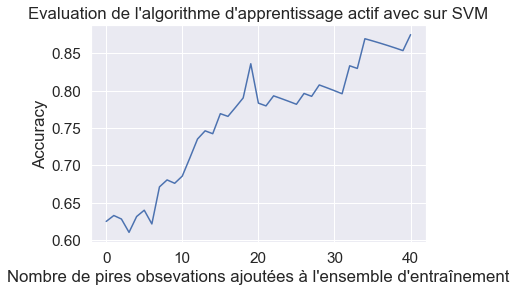

In [113]:
plt.plot(range(len(acc)), acc)# 'y', label = 'train accuracy')
#plt.plot(np.arange(5,100,1), acc_test_dt, label ='test accuracy')
#plt.legend(loc='lower right')
plt.title("Evaluation de l'algorithme d'apprentissage actif avec sur SVM")
plt.ylabel('Accuracy')
plt.xlabel("Nombre de pires obsevations ajoutées à l'ensemble d'entraînement")
plt.savefig("C:/Users/User/Desktop/imagepfe/oralepfeimg27")
plt.show()